In [187]:
import math
import sys
import os
sys.path.insert(0,'..')
from doe_xstock.data import CityLearnData
from citylearn.cost_function import CostFunction
from citylearn.utilities import read_json
import matplotlib.pyplot as plt
from matplotlib import ticker
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from src.utilities import DataHandler, FileHandler
import json
import matplotlib.colors as mcolors

In [2]:
LoD1_IDs = ['lod_1-citylearn-rbc-norbc-centralized-noreward-building_all-final-2022']

In [3]:
#TestID = ['lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_20-final-2022']
#data_test = pd.concat([DataHandler.get_concat_data(_id, 'time_series') for _id in TestID], ignore_index=True)
#data_test

In [4]:
SIMULATION_IDS = [
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_5-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_18-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_12-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_9-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_16-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_13-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_14-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_20-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_8-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_4-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_5-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_18-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_12-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_9-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_16-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_13-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_14-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_20-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_8-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_4-final-2022',
]

###  Indoor Setpoint vs. Heating Demand - LOD 1/LOD3 Comparison

In [5]:
data_lod1 = pd.concat([DataHandler.get_concat_data(_id, 'time_series') for _id in LoD1_IDs], ignore_index=True)
data_lod23 = pd.concat([DataHandler.get_concat_data(_id, 'time_series') for _id in SIMULATION_IDS], ignore_index=True)

In [6]:
#Only get relevant Lod1 data for select 10 buildings
# Get unique 'bldg_name' values from data_lod23
unique_bldg_names = data_lod23['bldg_name'].unique()

# Filter rows in data_lod1 based on whether 'bldg_name' is in unique_bldg_names
filtered_data_lod1 = data_lod1[data_lod1['bldg_name'].isin(unique_bldg_names)]

In [7]:
#vertically concatenate the two dfs
data_reg = pd.concat([data_lod23, filtered_data_lod1], ignore_index=True)

In [8]:
#data_reg = pd.concat([DataHandler.get_concat_data(_id, 'time_series') for _id in SIMULATION_IDS], ignore_index=True)
returned_ids = data_reg['id'].unique()
#assert len(returned_ids) == len(SIMULATION_IDS)\
    #and len(set(SIMULATION_IDS).difference(set(returned_ids))) == 0,\
        #'Inconsistent simulation IDs'

unique_values_in_order_reg = data_reg['bldg_name'].unique().tolist()
metadata = pd.read_csv(os.path.join(FileHandler.METADATA_DIRECTORY, 'building_cluster_metadata.csv'))
metadata['bldg_id'] = metadata['bldg_id'].astype(str)
metadata = metadata.rename(columns={'bldg_id': 'bldg_name', 'ID': 'bldg_index'})
data_reg = data_reg.merge(metadata[['bldg_name', 'bldg_index', 'setpoint_id']], on='bldg_name', how='left')
buildings_reg = unique_values_in_order_reg
data_reg = data_reg[data_reg['bldg_name'].isin(buildings_reg)].copy()
data_reg['lod'] = data_reg['id'].str.split('-', expand=True)[0]

In [97]:
mapping_dict = {
    1: 'Building 1',
    3: 'Building 2',
    4: 'Building 3',
    5: 'Building 4',
    10: 'Building 5',
    12: 'Building 6',
    13: 'Building 7',
    15: 'Building 8',
    19: 'Building 9',
    20: 'Building 10'
}

# Create the new column 'building_id' by mapping values from 'bldg_index'
data_reg['building_id'] = data_reg['bldg_index'].map(mapping_dict)

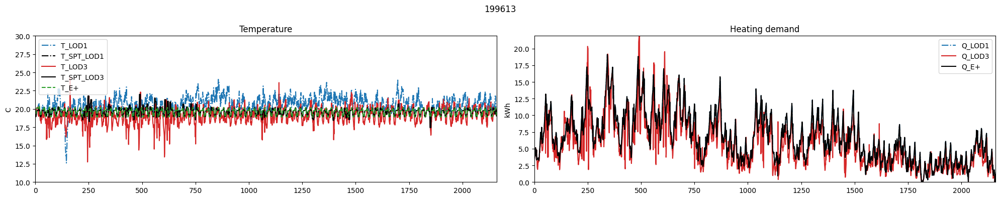

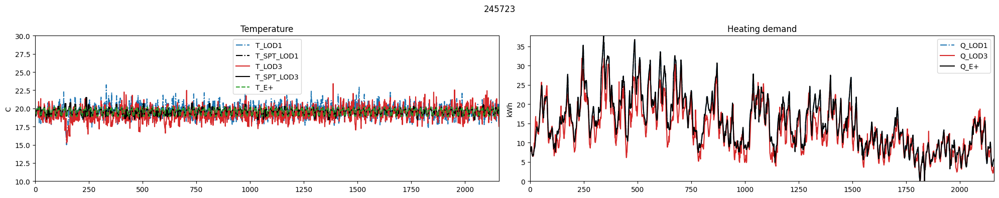

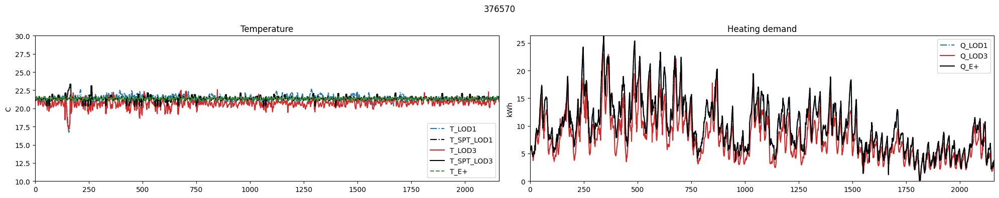

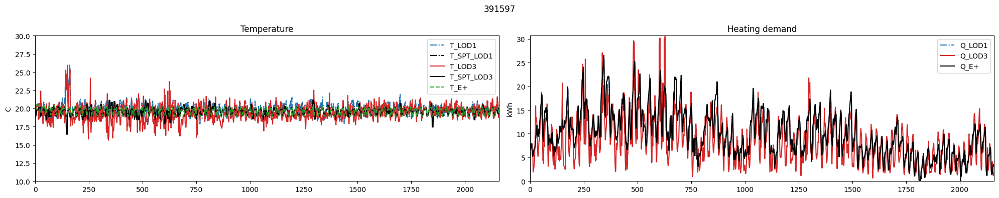

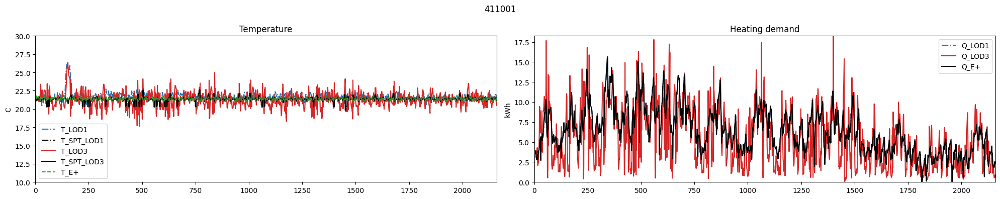

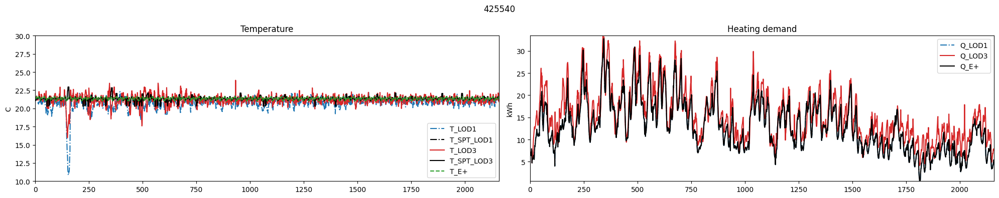

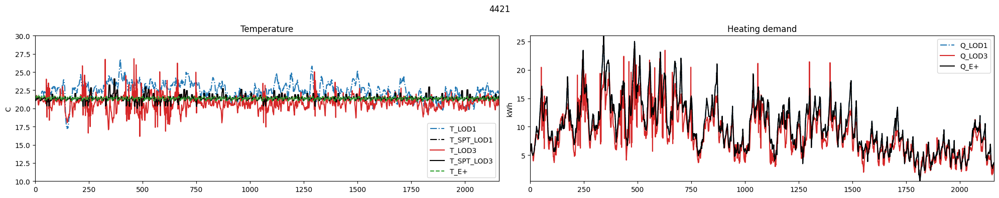

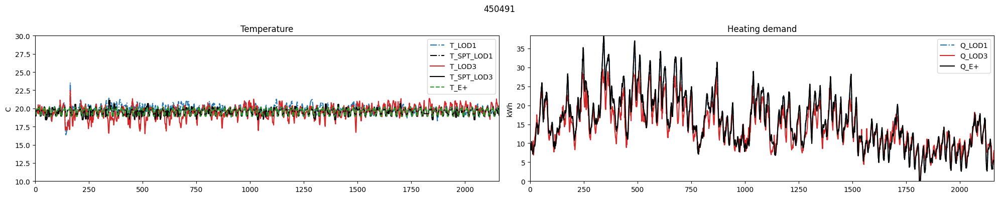

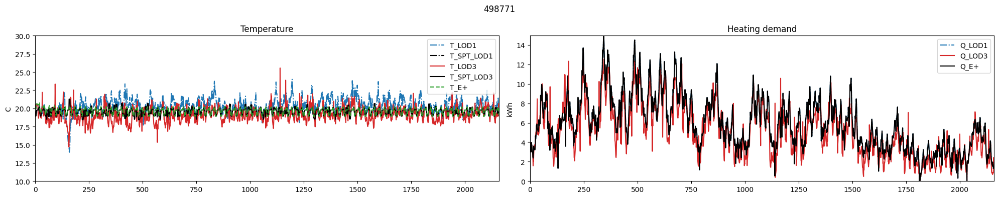

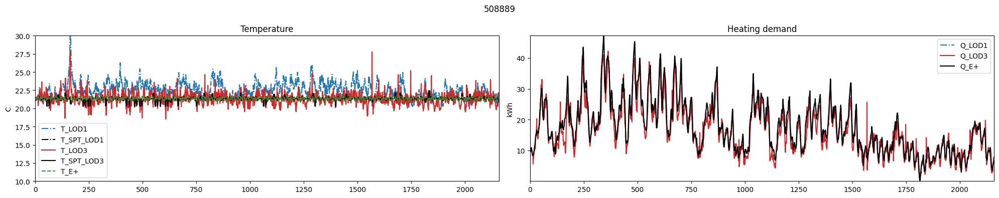

In [57]:
for b, bdata in data_reg.groupby('bldg_name'):
    fig, axs = plt.subplots(1, 2, figsize=(20, 4))
    lod1data = bdata[bdata['lod']=='lod_1'].copy()
    lod3data = bdata[bdata['lod']=='lod_3'].copy()
    x = lod1data['time_step'].tolist()

    # temperature
    y1 = lod1data['indoor_dry_bulb_temperature'].tolist()
    y2 = lod1data['indoor_dry_bulb_temperature_set_point'].tolist()
    y3 = lod3data['indoor_dry_bulb_temperature'].tolist()
    y4 = lod3data['indoor_dry_bulb_temperature_set_point'].tolist()
    y5 = lod3data['indoor_dry_bulb_temperature_without_partial_load'].tolist()
    fig.axes[0].plot(x, y1, label='T_LOD1', color='tab:blue', linestyle='-.')
    fig.axes[0].plot(x, y2, label='T_SPT_LOD1', color='black', linestyle='-.')
    fig.axes[0].plot(x, y3, label='T_LOD3', color='tab:red', linestyle='-')
    fig.axes[0].plot(x, y4, label='T_SPT_LOD3', color='black', linestyle='-')
    fig.axes[0].plot(x, y5, label='T_E+', color='tab:green', linestyle='--')
    fig.axes[0].set_title('Temperature')
    fig.axes[0].set_ylim(10,30)
    fig.axes[0].set_ylabel('C')
    fig.axes[0].margins(0)
    fig.axes[0].legend()
    

    # demand
    y1 = lod1data['heating_demand'].tolist()
    y2 = lod3data['heating_demand'].tolist()
    y3 = lod3data['heating_demand_without_partial_load'].tolist()
    fig.axes[1].plot(x, y1, label='Q_LOD1', color='tab:blue', linestyle='-.')
    fig.axes[1].plot(x, y2, label='Q_LOD3', color='tab:red', linestyle='-')
    fig.axes[1].plot(x, y3, label='Q_E+', color='black', linestyle='-')
    fig.axes[1].set_title('Heating demand')
    fig.axes[1].set_ylabel('kWh')
    fig.axes[1].margins(0)
    fig.axes[1].legend()

    fig.suptitle(b)
    plt.tight_layout()
    plt.show()

In [91]:
data_reg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 64800 entries, 0 to 64799
Data columns (total 43 columns):
 #   Column                                                               Non-Null Count  Dtype  
---  ------                                                               --------------  -----  
 0   bldg_name                                                            64800 non-null  object 
 1   net_electricity_consumption                                          64800 non-null  float64
 2   net_electricity_consumption_without_storage                          64800 non-null  float64
 3   net_electricity_consumption_without_storage_and_partial_load         64800 non-null  float64
 4   net_electricity_consumption_without_storage_and_partial_load_and_pv  64800 non-null  float64
 5   indoor_dry_bulb_temperature                                          64800 non-null  float64
 6   indoor_dry_bulb_temperature_without_partial_load                     64800 non-null  float64
 7   indo

In [ ]:
# Define a custom sorting function to extract numeric part of building_id
def sort_building_id(building_id):
    return int(building_id.split()[1])

# Sort the DataFrame by 'building_id' using the custom sorting function
data_reg_sorted = data_reg.copy()  # Make a copy to avoid modifying original DataFrame
data_reg_sorted['building_id_numeric'] = data_reg_sorted['building_id'].apply(sort_building_id)
data_reg_sorted = data_reg_sorted.sort_values(by='building_id_numeric')

In [103]:
data_reg_sorted

,bldg_name,net_electricity_consumption,net_electricity_consumption_without_storage,net_electricity_consumption_without_storage_and_partial_load,net_electricity_consumption_without_storage_and_partial_load_and_pv,indoor_dry_bulb_temperature,indoor_dry_bulb_temperature_without_partial_load,indoor_dry_bulb_temperature_set_point,indoor_dry_bulb_temperature_set_point_without_control,occupant_count,...,agent,rbc_name,random_seed,central_agent,reward_function_name,reward_function_kwargs,bldg_index,setpoint_id,building_id,building_id_numeric
0,199613,2.439795,2.439795,2.439795,2.439795,19.445417,19.445417,18.944445,18.944445,2.0,...,SAC,NoRBC,0,Centralized,ComfortReward,"{'lower_exponent': 1.0, 'higher_exponent': 1.0}",1,Tolerant,Building 1,1
22312,199613,6.286493,6.286493,7.641184,7.641184,18.598516,19.952082,19.944445,19.944445,2.0,...,SAC,NoRBC,0,Centralized,ComfortReward,"{'lower_exponent': 1.0, 'higher_exponent': 1.0}",1,Tolerant,Building 1,1
22313,199613,7.329976,7.329976,8.870595,8.870595,18.597029,20.063681,20.055555,20.055555,2.0,...,SAC,NoRBC,0,Centralized,ComfortReward,"{'lower_exponent': 1.0, 'higher_exponent': 1.0}",1,Tolerant,Building 1,1
22314,199613,8.049048,8.049048,9.498184,9.498184,18.736380,20.180086,20.166666,20.166666,2.0,...,SAC,NoRBC,0,Centralized,ComfortReward,"{'lower_exponent': 1.0, 'higher_exponent': 1.0}",1,Tolerant,Building 1,1
22315,199613,10.503712,10.503712,11.323886,11.323886,18.557825,20.182693,20.166666,20.166666,2.0,...,SAC,NoRBC,0,Centralized,ComfortReward,"{'lower_exponent': 1.0, 'higher_exponent': 1.0}",1,Tolerant,Building 1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42488,498771,5.733432,5.733432,6.259790,6.259790,18.857113,19.809126,19.777779,19.777779,1.0,...,SAC,NoRBC,0,Centralized,ComfortReward,"{'lower_exponent': 1.0, 'higher_exponent': 1.0}",20,Tolerant,Building 10,10
42489,498771,5.624794,5.624794,5.642949,5.642949,19.401295,19.809546,19.777779,19.777779,1.0,...,SAC,NoRBC,0,Centralized,ComfortReward,"{'lower_exponent': 1.0, 'higher_exponent': 1.0}",20,Tolerant,Building 10,10
42490,498771,4.418660,4.418660,4.733022,4.733022,19.439888,19.806845,19.777779,19.777779,1.0,...,SAC,NoRBC,0,Centralized,ComfortReward,"{'lower_exponent': 1.0, 'higher_exponent': 1.0}",20,Tolerant,Building 10,10
42476,498771,3.766176,3.766176,4.667180,4.667180,18.401600,20.024548,20.000000,20.000000,0.0,...,SAC,NoRBC,0,Centralized,ComfortReward,"{'lower_exponent': 1.0, 'higher_exponent': 1.0}",20,Tolerant,Building 10,10


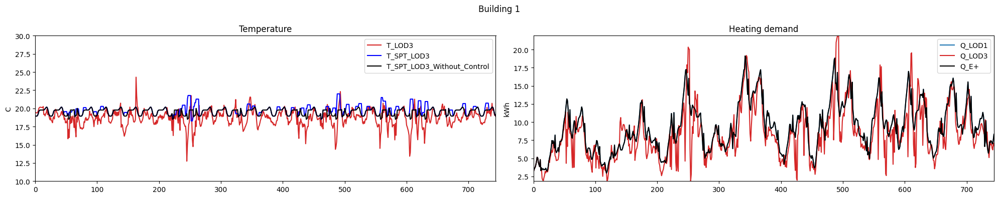

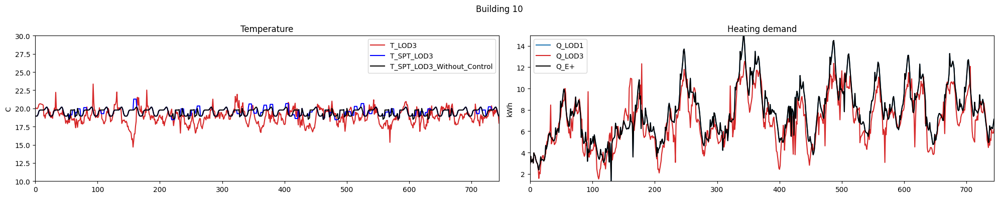

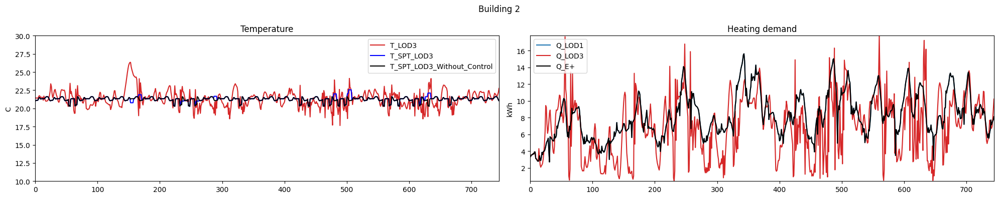

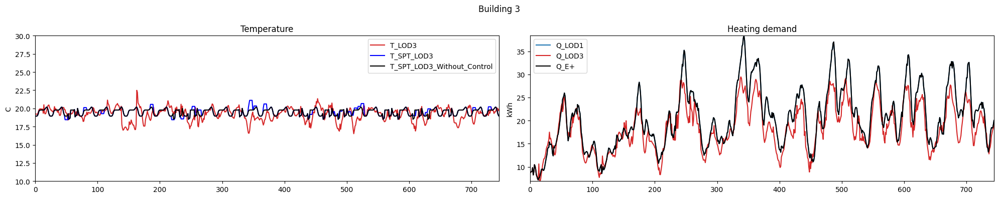

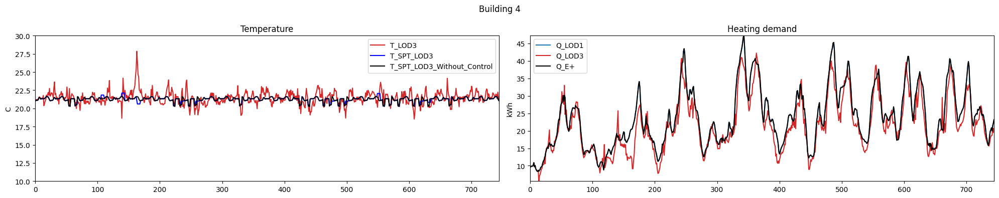

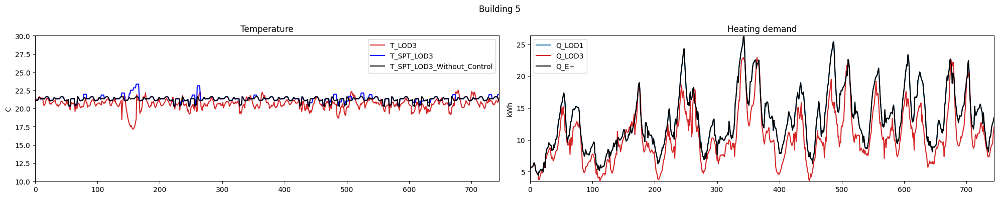

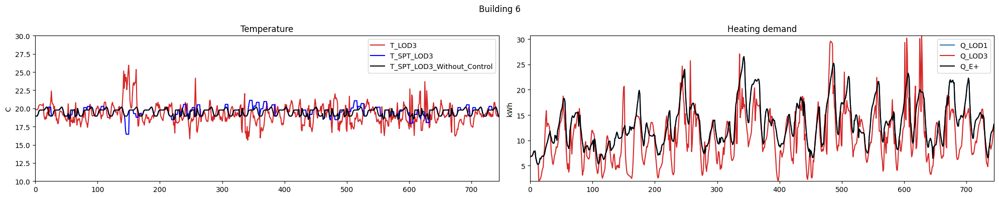

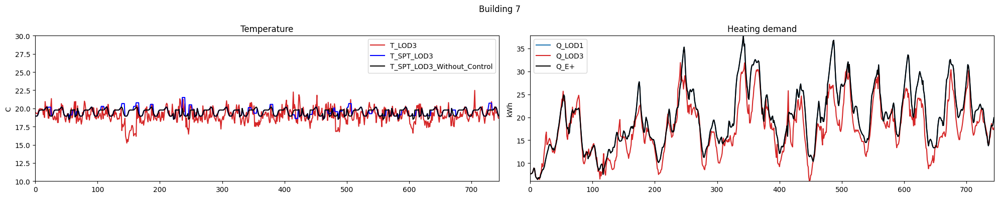

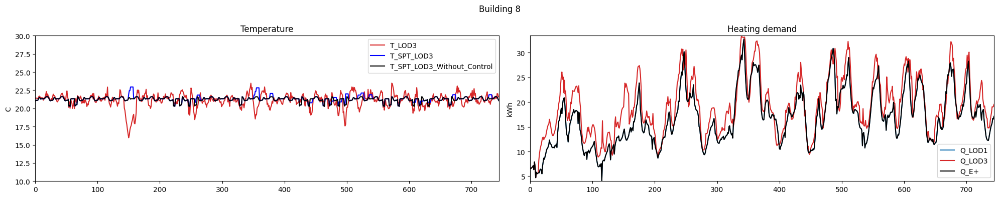

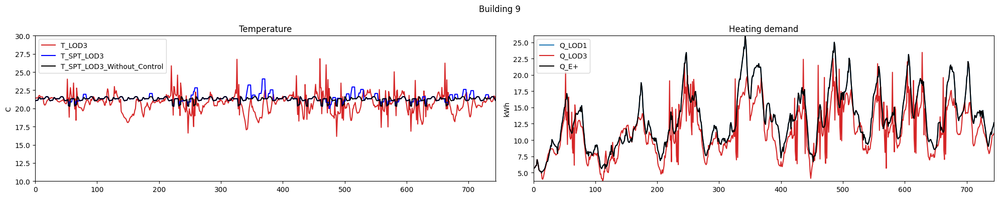

In [104]:
##Only looking at one month:

for b, bdata in data_reg.groupby('building_id'):
    fig, axs = plt.subplots(1, 2, figsize=(20, 4))
    lod1data = bdata[bdata['lod']=='lod_1'].copy()
    lod3data = bdata[bdata['lod']=='lod_3'].copy()
    x = lod1data[lod1data['time_step'].between(0, 744)]['time_step'].tolist()

    # temperature
    y1 = lod1data[lod1data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature'].tolist()
    y2 = lod1data[lod1data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature_set_point'].tolist()
    y3 = lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature'].tolist()
    y4 = lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature_set_point'].tolist()
    y5 = lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature_without_partial_load'].tolist()
    y6 = lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature_set_point_without_control'].tolist()
    #fig.axes[0].plot(x, y1, label='T_LOD1', color='tab:blue', linestyle='-.')
    fig.axes[0].plot(x, y3, label='T_LOD3', color='tab:red', linestyle='-')
    fig.axes[0].plot(x, y4, label='T_SPT_LOD3', color='blue', linestyle='-')
    #fig.axes[0].plot(x, y2, label='T_SPT_LOD1', color='green', linestyle='-')
    fig.axes[0].plot(x, y6, label='T_SPT_LOD3_Without_Control', color='black', linestyle='-')

    #fig.axes[0].plot(x, y5, label='T_E+', color='tab:green', linestyle='--')
    fig.axes[0].set_title('Temperature')
    fig.axes[0].set_ylim(10,30)
    fig.axes[0].set_ylabel('C')
    fig.axes[0].margins(0)
    fig.axes[0].legend()
    

    # demand
    y1 = lod1data[lod1data['time_step'].between(0, 744)]['heating_demand'].tolist()
    y2 = lod3data[lod3data['time_step'].between(0, 744)]['heating_demand'].tolist()
    y3 = lod3data[lod3data['time_step'].between(0, 744)]['heating_demand_without_partial_load'].tolist()
    fig.axes[1].plot(x, y1, label='Q_LOD1', color='tab:blue', linestyle='-')
    fig.axes[1].plot(x, y2, label='Q_LOD3', color='tab:red', linestyle='-')
    fig.axes[1].plot(x, y3, label='Q_E+', color='black', linestyle='-')
    fig.axes[1].set_title('Heating demand')
    fig.axes[1].set_ylabel('kWh')
    fig.axes[1].margins(0)
    fig.axes[1].legend()

    fig.suptitle(b)
    plt.tight_layout()
    plt.show()

In [123]:
import matplotlib

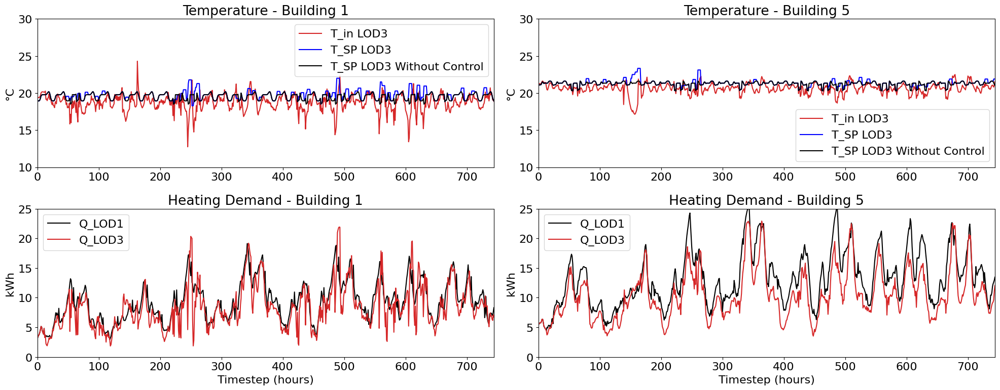

In [128]:
# Define the buildings you want to include
selected_buildings = ['Building 1', 'Building 5']

matplotlib.rcParams.update({'font.size': 16})

# Create subplots with two rows
fig, axs = plt.subplots(2, 2, figsize=(20, 8))

# Iterate over selected buildings
for i, building_id in enumerate(selected_buildings):
    bdata = data_reg[data_reg['building_id'] == building_id]
    lod1data = bdata[bdata['lod'] == 'lod_1'].copy()
    lod3data = bdata[bdata['lod'] == 'lod_3'].copy()
    x = lod1data[lod1data['time_step'].between(0, 744)]['time_step'].tolist()

    # Plot temperature for first row
    axs[0, i].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature'], label='T_in LOD3', color='tab:red', linestyle='-')
    axs[0, i].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature_set_point'], label='T_SP LOD3', color='blue', linestyle='-')
    axs[0, i].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature_set_point_without_control'], label='T_SP LOD3 Without Control', color='black', linestyle='-')
    axs[0, i].set_title(f'Temperature - {building_id}')
    axs[0, i].set_ylim(10, 30)
    axs[0, i].set_ylabel('\u00b0C')
    axs[0, i].margins(0)
    axs[0, i].legend()

    # Plot demand for second row
    axs[1, i].plot(x, lod1data[lod1data['time_step'].between(0, 744)]['heating_demand'], label='Q_LOD1', color='black', linestyle='-')
    axs[1, i].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['heating_demand'], label='Q_LOD3', color='tab:red', linestyle='-')
    #axs[1, i].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['heating_demand_without_partial_load'], label='Q_E+', color='black', linestyle='-')
    axs[1, i].set_title(f'Heating Demand - {building_id}')
    axs[1, i].set_ylabel('kWh')
    axs[1, i].set_xlabel('Timestep (hours)')
    axs[1, i].margins(0)
    axs[1, i].set_ylim(0, 25)
    axs[1, i].legend()

plt.tight_layout()
plt.show()

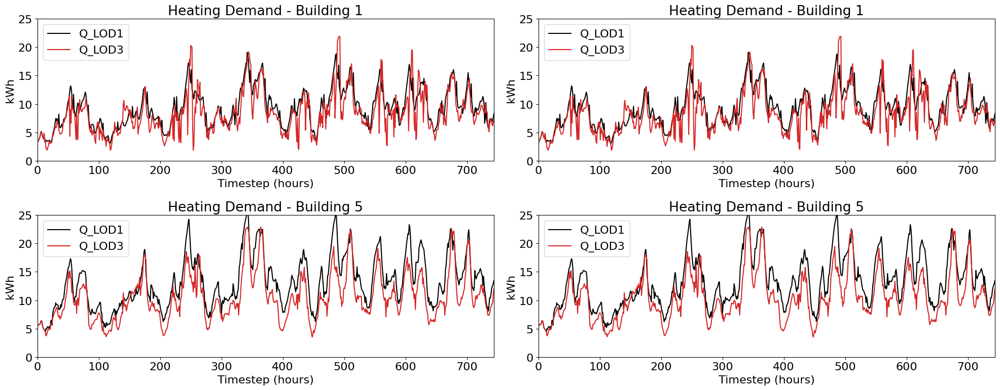

In [212]:
#plot for one week and then the whole time period

# Define the buildings you want to include
selected_buildings = ['Building 1', 'Building 5']

matplotlib.rcParams.update({'font.size': 16})

# Create subplots with two rows
fig, axs = plt.subplots(2, 2, figsize=(20, 8))

# Iterate over selected buildings
for i, building_id in enumerate(selected_buildings):
    bdata = data_reg[data_reg['building_id'] == building_id]
    lod1data = bdata[bdata['lod'] == 'lod_1'].copy()
    lod3data = bdata[bdata['lod'] == 'lod_3'].copy()
    x = lod1data[lod1data['time_step'].between(0, 744)]['time_step'].tolist()
    x_full = lod1data['time_step'].tolist()

    # Plot temperature for first row
    #axs[0, i].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature'], label='T_in LOD3', color='tab:red', linestyle='-')
    #axs[0, i].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature_set_point'], label='T_SP LOD3', color='blue', linestyle='-')
    #axs[0, i].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['indoor_dry_bulb_temperature_set_point_without_control'], label='T_SP LOD3 Without Control', color='black', linestyle='-')
    #axs[0, i].set_title(f'Temperature - {building_id}')
    #axs[0, i].set_ylim(10, 30)
    #axs[0, i].set_ylabel('\u00b0C')
    #axs[0, i].margins(0)
    #axs[0, i].legend()
    
    # demand
    y1 = lod1data['heating_demand'].tolist()
    y2 = lod3data['heating_demand'].tolist()
    y3 = lod3data['heating_demand_without_partial_load'].tolist()
    fig.axes[1].plot(x, y1, label='Q_LOD1', color='tab:blue', linestyle='-.')
    fig.axes[1].plot(x, y2, label='Q_LOD3', color='tab:red', linestyle='-')
    fig.axes[1].plot(x, y3, label='Q_E+', color='black', linestyle='-')
    
    #Demand first row: Bldg 1: one week, full duration 
    
    axs[i, 0].plot(x, lod1data[lod1data['time_step'].between(0, 744)]['heating_demand'], label='Q_LOD1', color='black', linestyle='-')
    axs[i, 0].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['heating_demand'], label='Q_LOD3', color='tab:red', linestyle='-')
    #axs[i, 0].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['heating_demand_without_partial_load'], label='Q_E+', color='black', linestyle='-')
    axs[i, 0].set_title(f'Heating Demand - {building_id}')
    axs[i, 0].set_ylabel('kWh')
    axs[i, 0].set_xlabel('Timestep (hours)')
    axs[i, 0].margins(0)
    axs[i, 0].set_ylim(0, 25)
    axs[i, 0].legend()

    # Plot demand for second row: Building 5: one week, full duration
    axs[i, 1].plot(x, lod1data[lod1data['time_step'].between(0, 744)]['heating_demand'], label='Q_LOD1', color='black', linestyle='-')
    axs[i, 1].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['heating_demand'], label='Q_LOD3', color='tab:red', linestyle='-')
    #axs[i, 1].plot(x, lod3data[lod3data['time_step'].between(0, 744)]['heating_demand_without_partial_load'], label='Q_E+', color='black', linestyle='-')
    axs[i, 1].set_title(f'Heating Demand - {building_id}')
    axs[i, 1].set_ylabel('kWh')
    axs[i, 1].set_xlabel('Timestep (hours)')
    axs[i, 1].margins(0)
    axs[i, 1].set_ylim(0, 25)
    axs[i, 1].legend()

plt.tight_layout()
plt.show()

### T_in vs T_SP for testing period, LOD 3

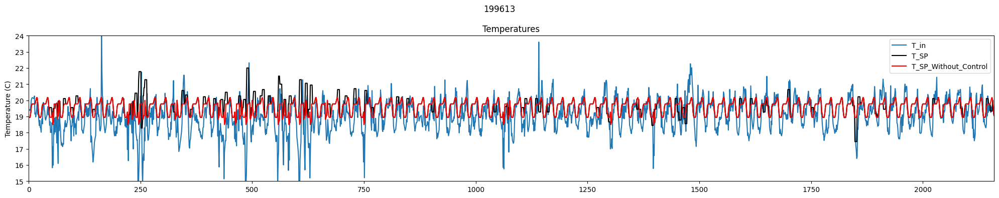

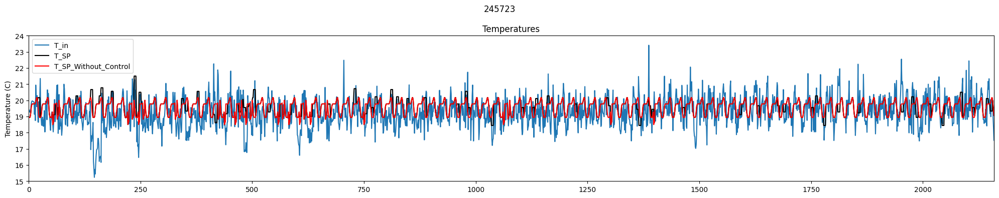

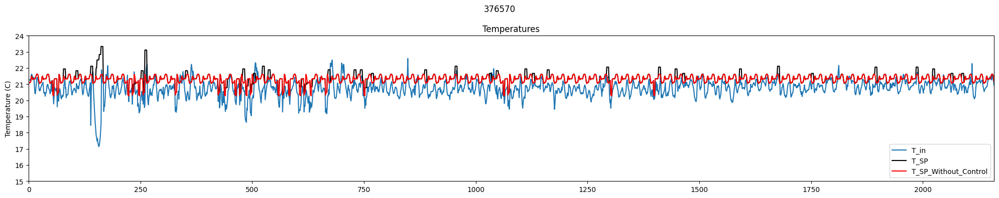

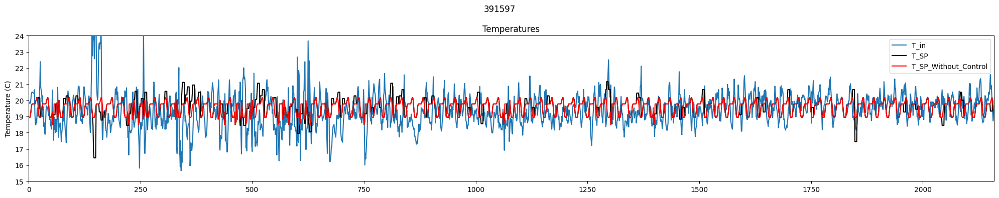

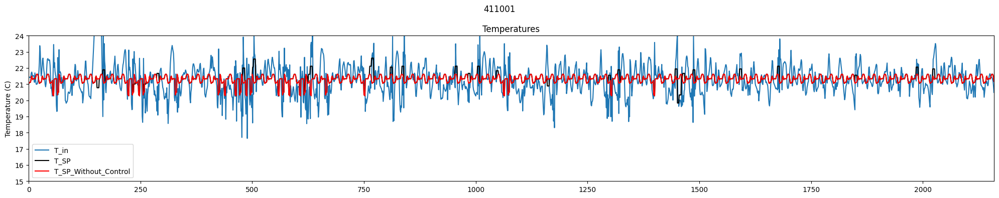

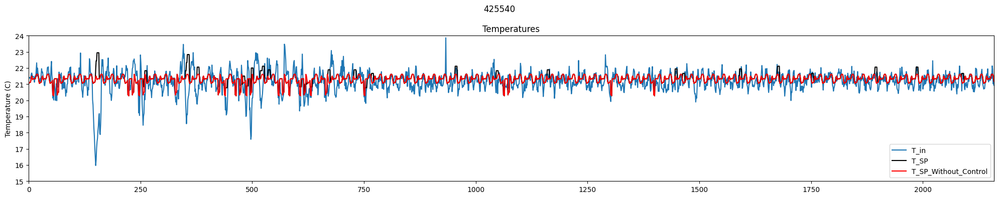

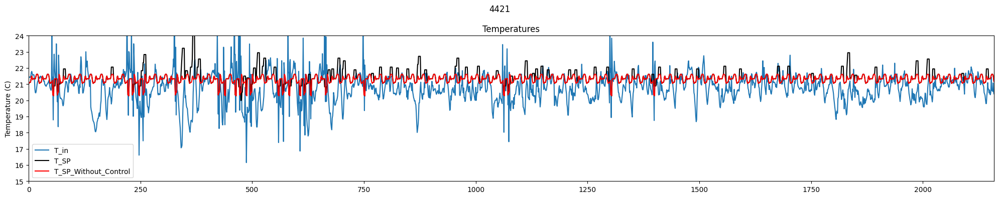

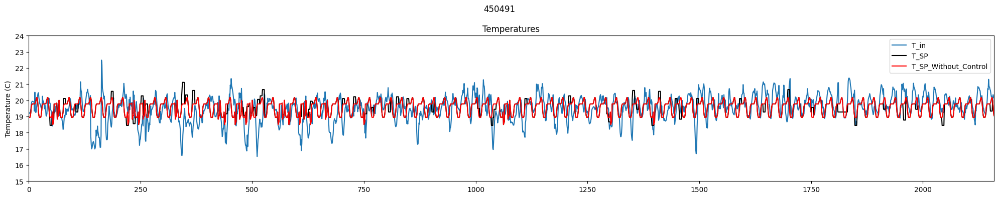

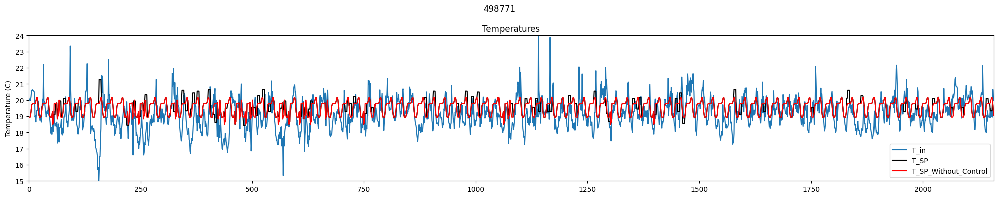

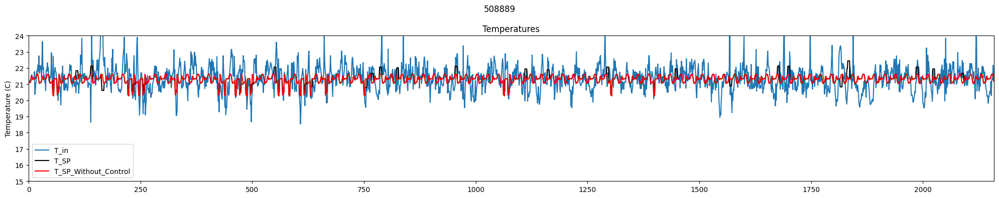

In [83]:
for b, bdata in data_reg.groupby('bldg_name'):
    fig, axs = plt.subplots(1, figsize=(20, 4))
    lod3data = bdata[bdata['lod']=='lod_3'].copy()
    x = lod3data['time_step'].tolist()

    # temperature
    y1 = lod3data['indoor_dry_bulb_temperature'].tolist()
    y2 = lod3data['indoor_dry_bulb_temperature_set_point'].tolist()
    y3 = lod3data['indoor_dry_bulb_temperature_set_point_without_control'].tolist()
    fig.axes[0].plot(x, y1, label='T_in', color='tab:blue') #linestyle='-.')
    fig.axes[0].plot(x, y2, label='T_SP', color='black') #linestyle='-.')
    fig.axes[0].plot(x, y3, label='T_SP_Without_Control', color='red') #linestyle='-.')


    fig.axes[0].set_title('Temperatures')
    fig.axes[0].set_ylim(15,24)
    fig.axes[0].set_ylabel('Temperature (C)')
    fig.axes[0].margins(0)
    fig.axes[0].legend()

    fig.suptitle(b)
    plt.tight_layout()
    plt.show()

In [10]:
print(data_reg.keys())

Index(['bldg_name', 'net_electricity_consumption',
       'net_electricity_consumption_without_storage',
       'net_electricity_consumption_without_storage_and_partial_load',
       'net_electricity_consumption_without_storage_and_partial_load_and_pv',
       'indoor_dry_bulb_temperature',
       'indoor_dry_bulb_temperature_without_partial_load',
       'indoor_dry_bulb_temperature_set_point',
       'indoor_dry_bulb_temperature_set_point_without_control',
       'occupant_count', 'heating_electricity_consumption', 'heating_demand',
       'heating_demand_without_partial_load', 'dhw_electricity_consumption',
       'dhw_demand', 'non_shiftable_load',
       'non_shiftable_load_electricity_consumption',
       'energy_to_non_shiftable_load', 'energy_from_dhw_device',
       'energy_from_heating_device', 'occupant_a_increase',
       'occupant_b_increase', 'occupant_a_decrease', 'occupant_b_decrease',
       'occupant_increase_setpoint_probability',
       'occupant_decrease_setpoint_p

### Plot the net electricity consumption for LOD 1 and LOD 3 for the testing period

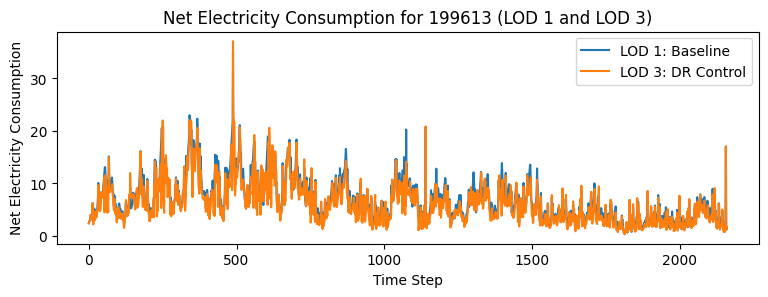

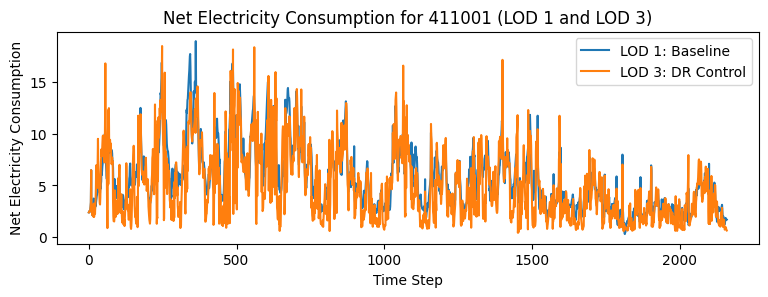

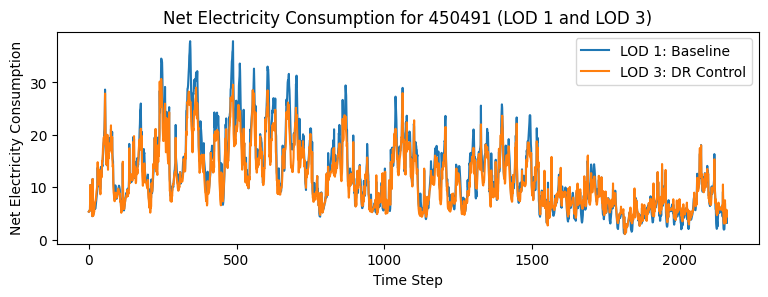

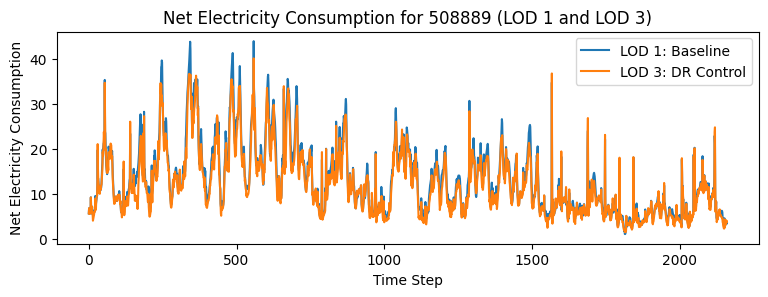

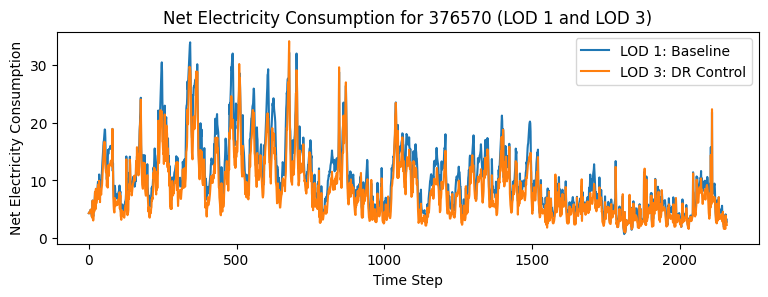

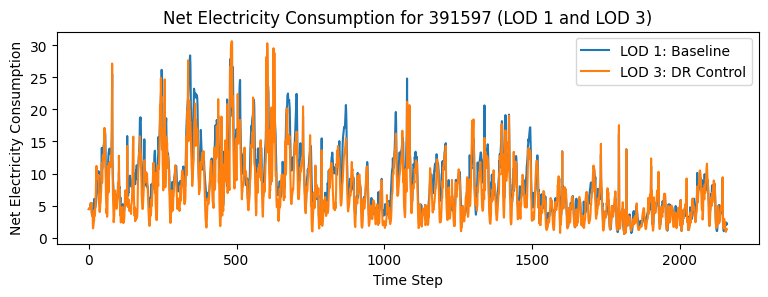

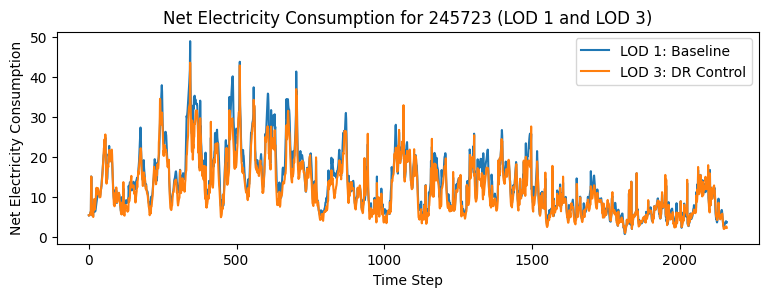

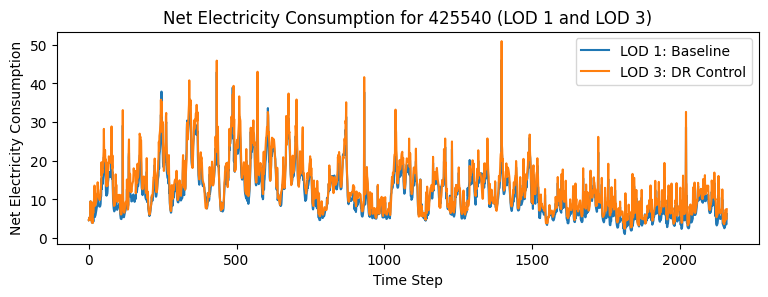

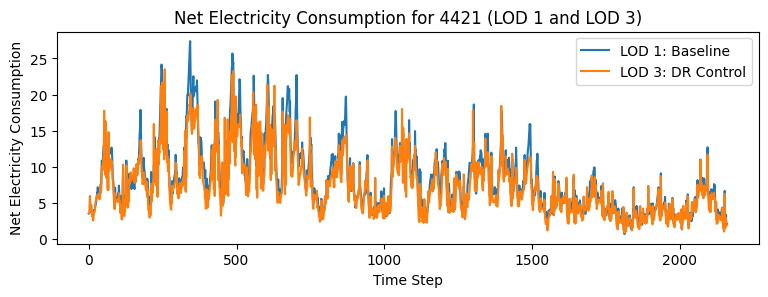

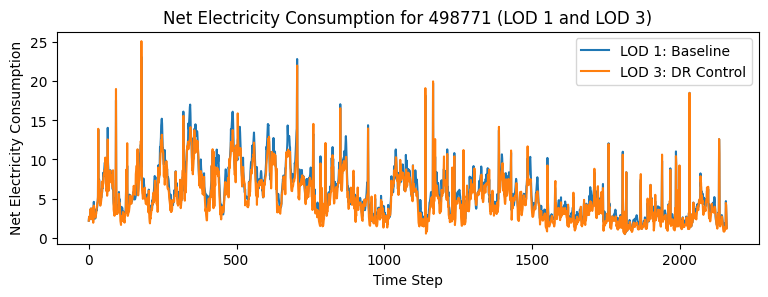

In [11]:
# Extract unique buildings
buildings = data_reg['bldg_name'].unique()

for building in buildings:
    # Create a new figure for each building with specified size
    plt.figure(figsize=(23/2.54, 7/2.54))  # Convert from cm to inches
    
    # Filter data for the current building
    building_data = data_reg[data_reg['bldg_name'] == building]
    
    # Extract data for LOD 1 and LOD 3
    lod1_data = building_data[building_data['lod'] == 'lod_1']
    lod3_data = building_data[building_data['lod'] == 'lod_3']
    
    # Plot net electricity consumption for LOD 1
    plt.plot(lod1_data['time_step'], lod1_data['net_electricity_consumption'], label='LOD 1: Baseline')
    
    # Plot net electricity consumption for LOD 3
    plt.plot(lod3_data['time_step'], lod3_data['net_electricity_consumption'], label='LOD 3: DR Control')

    plt.xlabel('Time Step')
    plt.ylabel('Net Electricity Consumption')
    plt.title(f'Net Electricity Consumption for {building} (LOD 1 and LOD 3)')
    plt.legend()
    plt.show()

### Calculate for each building: net electricity consumption during DR events, LOD1 vs LOD3

In [12]:
# Note - change file path to work for your computer
file_path = os.path.join(FileHandler.DATA_DIRECTORY, 'DR_Setpoints_Electricity_Prices/DR_Events_2022.csv')

df_DR_events_2022 = pd.read_csv(file_path)

In [13]:
dr_event_electricity_summary = pd.DataFrame(columns=['bldg_name', 'DR_Event', 'lod_1_net_electricity', 'lod_3_net_electricity', 'DR_Savings'])

for building in buildings:
    # Filter data for the current building
    building_data = data_reg[data_reg['bldg_name'] == building]
    
    # Extract data for LOD 1 and LOD 3
    lod1_data = building_data[building_data['lod'] == 'lod_1']
    lod3_data = building_data[building_data['lod'] == 'lod_3']
    
    # Filter df_DR_events_2022 for the rows where 'DR_Event_Timestep' = 1
    #dr_event_timestep = df_DR_events_2022[df_DR_events_2022['DR_Event_Timestep'] == 1]['time_step'].iloc[0]
    dr_event_timesteps = df_DR_events_2022[df_DR_events_2022['DR_Event_Timestep'] == 1]

    # Filter lod1_data and lod3_data for rows where a dr event occurs (is in dr_event_timesteps)
    lod1_data_dr = lod1_data[lod1_data['time_step'].isin(dr_event_timesteps['time_step'])]
    lod3_data_dr = lod3_data[lod3_data['time_step'].isin(dr_event_timesteps['time_step'])]
    
    # Merge 'DR_Events' column from df_DR_events_2022 into lod1_data_dr and lod3_data_dr by 'time_step'
    lod1_data_dr = pd.merge(lod1_data_dr, df_DR_events_2022[['time_step', 'DR_Event']], on='time_step')
    lod3_data_dr = pd.merge(lod3_data_dr, df_DR_events_2022[['time_step', 'DR_Event']], on='time_step')

    # Sum of net electricity consumption for LOD 1 , LOD 3
    lod1_net_electricity_sum = lod1_data_dr['net_electricity_consumption'].sum()
    lod3_net_electricity_sum = lod3_data_dr['net_electricity_consumption'].sum()
    
    # DR_Savings percentage difference between LOD 1 , LOD 3
    dr_savings = ((lod1_net_electricity_sum - lod3_net_electricity_sum) / lod1_net_electricity_sum) * 100
    
    # Append the summary to dr_event_electricity_summary DataFrame
    dr_event_electricity_summary = dr_event_electricity_summary.append({
        'bldg_name': building,
        'DR_Event': lod1_data_dr['DR_Event'].iloc[0],  # Assuming the DR event is same for LOD 1 and LOD 3
        'lod_1_net_electricity': lod1_net_electricity_sum,
        'lod_3_net_electricity': lod3_net_electricity_sum,
        'DR_Savings': dr_savings
    }, ignore_index=True)

In [14]:
dr_event_electricity_summary

,bldg_name,DR_Event,lod_1_net_electricity,lod_3_net_electricity,DR_Savings
0,199613,1,1131.034886,870.372316,23.046378
1,411001,1,860.802252,743.168286,13.665620
2,450491,1,1939.474089,1671.524667,13.815571
3,508889,1,2062.406452,1746.799481,15.302850
4,376570,1,1624.632408,1151.720641,29.108847
5,391597,1,1341.425181,1078.296386,19.615615
6,245723,1,2091.435972,1748.166383,16.413105
7,425540,1,1735.269038,1785.323122,-2.884514
8,4421,1,1297.893720,1036.029936,20.176058
9,498771,1,845.612964,701.063353,17.094063


In [15]:
dr_event_electricity_summary = pd.DataFrame(columns=['bldg_name', 'DR_Event', 'lod_1_net_electricity','lod_2_net_electricity', 'lod_3_net_electricity', 'DR_Savings_LOD3'])

for building in buildings:
    # Filter data for the current building
    building_data = data_reg[data_reg['bldg_name'] == building]
    
    # Extract data for LOD 1 and LOD 3
    lod1_data = building_data[building_data['lod'] == 'lod_1']
    lod2_data = building_data[building_data['lod'] == 'lod_2']
    lod3_data = building_data[building_data['lod'] == 'lod_3']
    
    # Filter df_DR_events_2022 for the rows where 'DR_Event_Timestep' = 1
    #dr_event_timestep = df_DR_events_2022[df_DR_events_2022['DR_Event_Timestep'] == 1]['time_step'].iloc[0]
    dr_event_timesteps = df_DR_events_2022[df_DR_events_2022['DR_Event_Timestep'] == 1]

    # Filter lod1_data and lod3_data for rows where a dr event occurs (is in dr_event_timesteps)
    lod1_data_dr = lod1_data[lod1_data['time_step'].isin(dr_event_timesteps['time_step'])]
    lod2_data_dr = lod2_data[lod2_data['time_step'].isin(dr_event_timesteps['time_step'])]
    lod3_data_dr = lod3_data[lod3_data['time_step'].isin(dr_event_timesteps['time_step'])]
    
    # Merge 'DR_Events' column from df_DR_events_2022 into lod1_data_dr and lod3_data_dr by 'time_step'
    lod1_data_dr = pd.merge(lod1_data_dr, df_DR_events_2022[['time_step', 'DR_Event']], on='time_step')
    lod2_data_dr = pd.merge(lod2_data_dr, df_DR_events_2022[['time_step', 'DR_Event']], on='time_step')
    lod3_data_dr = pd.merge(lod3_data_dr, df_DR_events_2022[['time_step', 'DR_Event']], on='time_step')

    # Sum of net electricity consumption for LODs
    lod1_net_electricity_sum = lod1_data_dr['net_electricity_consumption'].sum()
    lod2_net_electricity_sum = lod2_data_dr['net_electricity_consumption'].sum()
    lod3_net_electricity_sum = lod3_data_dr['net_electricity_consumption'].sum()
    
    # DR_Savings percentage difference between LOD1 and LOD3
    dr_savings = ((lod1_net_electricity_sum - lod3_net_electricity_sum) / lod1_net_electricity_sum) * 100
    
    # Append the summary to dr_event_electricity_summary DataFrame
    dr_event_electricity_summary = dr_event_electricity_summary.append({
        'bldg_name': building,
        'DR_Event': lod1_data_dr['DR_Event'].iloc[0],  # Assuming the DR event is same for LOD 1 and LOD 3
        'lod_1_net_electricity': lod1_net_electricity_sum,
        'lod_2_net_electricity': lod2_net_electricity_sum,
        'lod_3_net_electricity': lod3_net_electricity_sum,
        'DR_Savings_LOD3': dr_savings
    }, ignore_index=True)

In [16]:
dr_event_electricity_summary

,bldg_name,DR_Event,lod_1_net_electricity,lod_2_net_electricity,lod_3_net_electricity,DR_Savings_LOD3
0,199613,1,1131.034886,1011.559999,870.372316,23.046378
1,411001,1,860.802252,665.394116,743.168286,13.665620
2,450491,1,1939.474089,1746.383391,1671.524667,13.815571
3,508889,1,2062.406452,1819.793380,1746.799481,15.302850
4,376570,1,1624.632408,1396.081368,1151.720641,29.108847
5,391597,1,1341.425181,1172.947843,1078.296386,19.615615
6,245723,1,2091.435972,1947.712713,1748.166383,16.413105
7,425540,1,1735.269038,1948.694238,1785.323122,-2.884514
8,4421,1,1297.893720,1175.941922,1036.029936,20.176058
9,498771,1,845.612964,775.135755,701.063353,17.094063


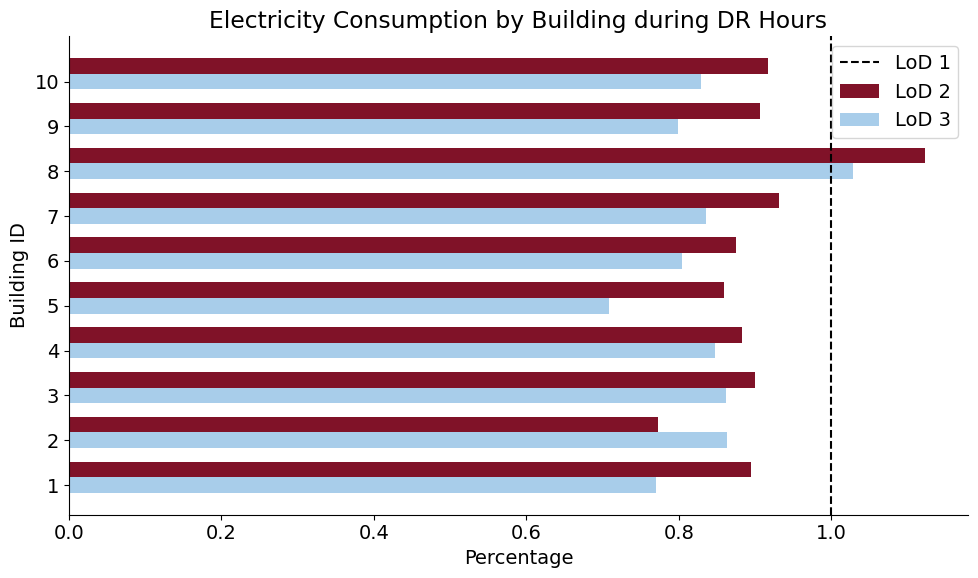

In [197]:
# Calculate percentages
dr_event_electricity_summary['lod_2_percentage'] = (dr_event_electricity_summary['lod_2_net_electricity'] / dr_event_electricity_summary['lod_1_net_electricity'])
dr_event_electricity_summary['lod_3_percentage'] = (dr_event_electricity_summary['lod_3_net_electricity'] / dr_event_electricity_summary['lod_1_net_electricity'])

# Plotting
plt.figure(figsize=(10, 6))

bar_width = 0.35
index = np.arange(len(dr_event_electricity_summary))

# Plotting bars
#plt.barh(index, dr_event_electricity_summary['lod_1_net_electricity'], height=bar_width, label='lod_1_net_electricity')
plt.barh(index + 2 * bar_width, dr_event_electricity_summary['lod_2_percentage'], height=bar_width, label='LoD 2', color = '#801228')
plt.barh(index + bar_width, dr_event_electricity_summary['lod_3_percentage'], height=bar_width, label='LoD 3', color = '#A8CDEA')
plt.axvline(1.0, color='black', linestyle='--', label='LoD 1')

#custom_palette = ['#801228', '#A8CDEA']

dr_event_electricity_summary['Building'] = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# Adding labels and title
plt.xlabel('Percentage')
plt.ylabel('Building ID', fontsize = 14)
plt.title('Electricity Consumption by Building during DR Hours')
plt.yticks(index + bar_width, dr_event_electricity_summary['Building'], fontsize=14)

plt.legend(loc='upper right')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Show plot
plt.tight_layout()
plt.show()

In [129]:
average_lod_3_percentage = dr_event_electricity_summary['lod_3_percentage'].mean()
print("Average LoD 3 Percentage:", average_lod_3_percentage)

Average LoD 3 Percentage: 0.8346464076045452


In [211]:
average_lod_2_percentage = dr_event_electricity_summary['lod_2_percentage'].mean()
print("Average LoD 2 Percentage:", average_lod_2_percentage)

Average LoD 2 Percentage: 0.9060858008618137


### Calculate for each building: Daily peak demand during DR events vs. Non-DR days

In [17]:
# Create an empty DataFrame to store the extracted values
day_values_df = pd.DataFrame(columns=['Day', 'DR_Day'])

# Iterate over each day
for day in range(1, len(df_DR_events_2022) // 24 + 1):
    # Calculate the start and end index for each day
    start_index = (day - 1) * 24
    end_index = day * 24
    
    # Extract the 'DR_Day' value for the day
    dr_day_value = df_DR_events_2022.iloc[start_index]['DR_Day']
    
    # Append the day and its corresponding 'DR_Day' value to the new DataFrame
    day_values_df = day_values_df.append({'Day': day, 'DR_Day': dr_day_value}, ignore_index=True)

# Print the new DataFrame
print(day_values_df)

   Day DR_Day
0    1      0
1    2      0
2    3      1
3    4      0
4    5      0
..  ..    ...
85  86      0
86  87      0
87  88      0
88  89      0
89  90      0

[90 rows x 2 columns]


In [18]:
# Create an empty DataFrame to store the results
lod1_daily = pd.DataFrame(columns=['Building_Name', 'Day', 'Maximum_Net_Electricity_Consumption'])
lod3_daily = pd.DataFrame(columns=['Building_Name', 'Day', 'Maximum_Net_Electricity_Consumption'])

for building in buildings:
    # Filter data for the current building
    building_data = data_reg[data_reg['bldg_name'] == building]
    
    # Extract data for LOD 1 and LOD 3
    lod1_data = building_data[building_data['lod'] == 'lod_1']
    lod3_data = building_data[building_data['lod'] == 'lod_3']
    
    # Iterate through filtered data to calculate daily maximums for LOD 1
    for day in range(1, int(len(lod1_data) / 24) + 1):
        start_idx = (day - 1) * 24
        end_idx = day * 24
        daily_max = lod1_data.iloc[start_idx:end_idx]['net_electricity_consumption'].max()
        lod1_daily = lod1_daily.append({'Building_Name': building, 'Day': day, 'Maximum_Net_Electricity_Consumption': daily_max}, ignore_index=True)
        
    # Iterate through filtered data to calculate daily maximums for LOD 3
    for day in range(1, int(len(lod3_data) / 24) + 1):
        start_idx = (day - 1) * 24
        end_idx = day * 24
        daily_max_3 = lod3_data.iloc[start_idx:end_idx]['net_electricity_consumption'].max()
        lod3_daily = lod3_daily.append({'Building_Name': building, 'Day': day, 'Maximum_Net_Electricity_Consumption': daily_max_3}, ignore_index=True)

In [19]:
## Merge
lod1_merge = pd.merge(lod1_daily, day_values_df, on='Day')
lod3_merge = pd.merge(lod3_daily, day_values_df, on='Day')

In [20]:
# If DR_Day is not equal to 0, it is a day where DR events happened
lod1_merge['DR_Category'] = (lod1_merge['DR_Day'] != 0).astype(int)
lod3_merge['DR_Category'] = (lod3_merge['DR_Day'] != 0).astype(int)

# Group by building name and DR_Category
lod1_grouped = lod1_merge.groupby(['Building_Name', 'DR_Category'])
lod3_grouped = lod3_merge.groupby(['Building_Name', 'DR_Category'])

# Calculate Max_Average_DR and Max_Average_Non_DR for LOD 1
lod1_summary = lod1_grouped['Maximum_Net_Electricity_Consumption'].mean().reset_index()
lod1_max_average_dr = lod1_summary[lod1_summary['DR_Category'] == 1].groupby('Building_Name')['Maximum_Net_Electricity_Consumption'].max().reset_index()
lod1_max_average_non_dr = lod1_summary[lod1_summary['DR_Category'] == 0].groupby('Building_Name')['Maximum_Net_Electricity_Consumption'].max().reset_index()
lod1_summary = pd.merge(lod1_max_average_dr, lod1_max_average_non_dr, on='Building_Name', suffixes=('_DR_lod1', '_Non_DR_lod1'))

# Calculate Max_Average_DR and Max_Average_Non_DR for LOD 3
lod3_summary = lod3_grouped['Maximum_Net_Electricity_Consumption'].mean().reset_index()
lod3_max_average_dr = lod3_summary[lod3_summary['DR_Category'] == 1].groupby('Building_Name')['Maximum_Net_Electricity_Consumption'].max().reset_index()
lod3_max_average_non_dr = lod3_summary[lod3_summary['DR_Category'] == 0].groupby('Building_Name')['Maximum_Net_Electricity_Consumption'].max().reset_index()
lod3_summary = pd.merge(lod3_max_average_dr, lod3_max_average_non_dr, on='Building_Name', suffixes=('_DR_lod3', '_Non_DR_lod3'))

avg_peak_electricity_summary = pd.merge(lod1_summary, lod3_summary, on='Building_Name')

In [21]:
# Calculate percentage difference for DR category
avg_peak_electricity_summary['Percentage_Difference_DR'] = ((avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_DR_lod1'] - avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_DR_lod3']) / avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_DR_lod3']) * 100

# Calculate percentage difference for Non-DR category
avg_peak_electricity_summary['Percentage_Difference_Non_DR'] = ((avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_Non_DR_lod1'] - avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_Non_DR_lod3']) / avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_Non_DR_lod3']) * 100

In [22]:
avg_peak_electricity_summary

,Building_Name,Maximum_Net_Electricity_Consumption_DR_lod1,Maximum_Net_Electricity_Consumption_Non_DR_lod1,Maximum_Net_Electricity_Consumption_DR_lod3,Maximum_Net_Electricity_Consumption_Non_DR_lod3,Percentage_Difference_DR,Percentage_Difference_Non_DR
0,199613,16.614713,10.183247,16.101579,9.937311,3.186855,2.474872
1,245723,30.246068,18.295446,27.620307,17.519542,9.506632,4.428790
2,376570,23.190388,14.395943,19.023846,13.087460,21.901679,9.997989
3,391597,20.322592,12.554126,21.149795,12.162344,-3.911164,3.221268
4,411001,12.439907,7.717097,13.962912,8.106588,-10.907506,-4.804633
5,425540,29.077438,18.242744,31.446803,20.776605,-7.534518,-12.195743
6,4421,18.686435,11.028057,18.711323,9.912658,-0.133010,11.252272
7,450491,27.333061,17.156776,24.648717,15.969546,10.890399,7.434340
8,498771,12.269410,9.769819,11.261431,9.542507,8.950717,2.382102
9,508889,30.691367,18.692020,28.565146,17.961202,7.443410,4.068868


### Plot the setpoint temperatures for the two clusters including the setbacks implemented for DR (F, C)

In [23]:
file_path = os.path.join(FileHandler.DATA_DIRECTORY, 'DR_Setpoints_Electricity_Prices/ALL_DR_Setpoints.csv')
DR_setpoints = pd.read_csv(file_path, parse_dates=['datetime'])

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


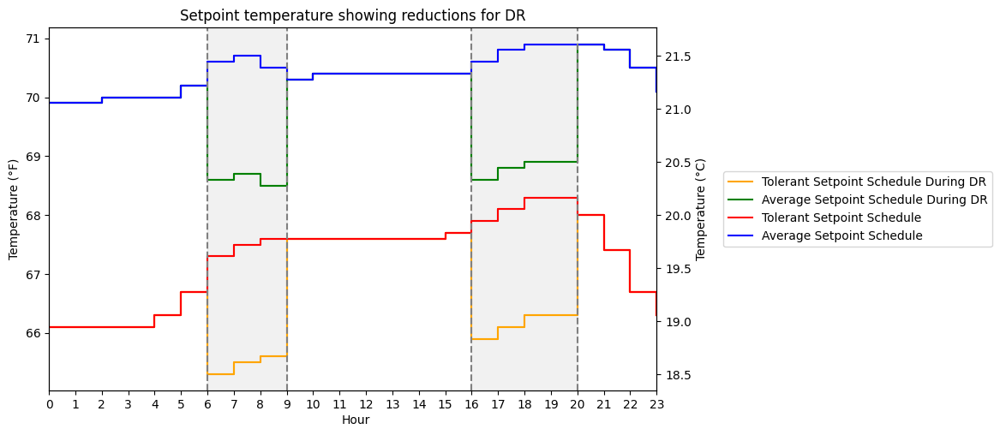

In [24]:
# Assuming df is your dataframe containing the data
# Filter data for January 9, 2022, and January 10, 2022
start_date_9 = '2022-01-09'
end_date_9 = '2022-01-10'
start_date_10 = '2022-01-10'
end_date_10 = '2022-01-11'

df_9 = DR_setpoints[(DR_setpoints['datetime'] >= start_date_9) & (DR_setpoints['datetime'] < end_date_9)]
df_10 = DR_setpoints[(DR_setpoints['datetime'] >= start_date_10) & (DR_setpoints['datetime'] < end_date_10)]

# Extract hour from datetime and create a new 'hour' column
df_9['hour'] = df_9['datetime'].dt.hour
df_10['hour'] = df_10['datetime'].dt.hour

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 5))

# Create a second y-axis for Celsius
ax2 = ax1.twinx()

# Plot Fahrenheit data
ax1.step(df_10['hour'], df_10['Setpoints_Tolerant'], label='Tolerant Setpoint Schedule During DR', color='orange', where='post')
ax1.step(df_10['hour'], df_10['Setpoints_Average'], label='Average Setpoint Schedule During DR', color='green', where='post')
ax1.step(df_9['hour'], df_9['Setpoints_Tolerant'], label='Tolerant Setpoint Schedule', color='red', where='post')
ax1.step(df_9['hour'], df_9['Setpoints_Average'], label='Average Setpoint Schedule', color='blue', where='post')
ax1.set_ylabel('Temperature (°F)', color='black')
ax1.tick_params('y', colors='black')

# Plot Celsius data
ax2.step(df_10['hour'], df_10['Setpoints_Tolerant_C'], label='Setpoints_Tolerant (C)', color='orange', where='post')
ax2.step(df_10['hour'], df_10['Setpoints_Average_C'], label='Setpoints_Average (C)', color='green', where='post')
ax2.step(df_9['hour'], df_9['Setpoints_Tolerant_C'], label='Setpoints_Tolerant (C)', color='red', where='post')
ax2.step(df_9['hour'], df_9['Setpoints_Average_C'], label='Setpoints_Average (C)', color='blue', where='post')
ax2.set_ylabel('Temperature (°C)', color='black')
ax2.tick_params('y', colors='black')

# Set x-axis labels
plt.xlabel('Hour of the day')
plt.xticks(range(24))  # Assuming data spans across 24 hours
plt.xlim(0, 23)  # Set the x-axis limit from 0 to 23 (24 hours)

# Set title
plt.title('Setpoint temperature showing reductions for DR')

# Add vertical dashed lines at specific hours
hours = [6, 9, 16, 20]
for hour in hours:
    plt.axvline(x=hour, color='gray', linestyle='--')

# Add light shading between hours 6-8 and hours 16-20
plt.axvspan(6, 9, color='lightgray', alpha=0.3)
plt.axvspan(16, 20, color='lightgray', alpha=0.3)

# Add legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1
labels = labels1

plt.legend(lines, labels, loc='center left', bbox_to_anchor=(1.10, 0.5))
#plt.legend(lines, labels, loc='upper right')
plt.tight_layout()
fig.text(0.35, 0, 'Hour', ha='center')
plt.show()

### Plot the following KPIs on a horizontal bar graph with LOD 1 as the baseline

In [49]:
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap

# Define custom colors
color1 = '#801228'
color2 = '#015073'

# Create custom colormap
colors = [mcolors.to_rgba(color1, alpha=0.4), color2]
custom_cmap = ListedColormap(colors)

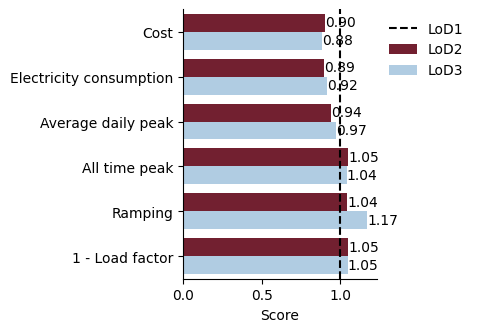

In [43]:
##KPIs: net electricity consumption, average daily peak demand, ramping, load factor, cost; comparing LOD 1, LOD 2, LOD 3
### Note: may not include all KPIs in final paper, for example ramping, 1 - LF may not be relevant/necessary since we didn't
### really do anything to specifically target these KPIs

directory = os.path.join(FileHandler.JOURNAL_PAPER_FIGURES_DIRECTORY, 'kpi')
os.makedirs(directory, exist_ok=True)

def get_kpis(lod: str, electricity_consumption: list, cost: list):
    return {
        'LoD': 'LoD' + (lod.split('_')[-1]),
        'Cost': CostFunction.cost(cost)[-1],
        'Electricity consumption': CostFunction.electricity_consumption(electricity_consumption)[-1],
        'Average daily peak': CostFunction.peak(electricity_consumption, window=24)[-1],
        'All time peak': CostFunction.peak(electricity_consumption, window=ldata.shape[0] + 1)[-1],
        'Ramping': CostFunction.ramping(electricity_consumption)[-1],
        '1 - Load factor': CostFunction.one_minus_load_factor(electricity_consumption, window=730)[-1],
    }

records = []
building_kpis = [
    'Cost', 
    'Electricity consumption'
]

# building level
for (b, l), ldata in data_reg.groupby(['bldg_name', 'lod']):
    electricity_consumption = ldata['net_electricity_consumption'].tolist()
    cost = ldata['net_electricity_consumption_cost'].tolist()
    record = {
        'environment': b,
        **get_kpis(l, electricity_consumption, cost)
    }
    records.append(record)

# district level
plot_data = data_reg.copy()
plot_data = plot_data.groupby(['lod', 'bldg_name', 'time_step'])[[
    'net_electricity_consumption', 'net_electricity_consumption_cost'
]].sum().reset_index()

for l, ldata in plot_data.groupby('lod'):
    electricity_consumption = ldata['net_electricity_consumption'].tolist()
    cost = ldata['net_electricity_consumption_cost'].tolist()
    _record = get_kpis(l, electricity_consumption, cost)
    record = {
        'environment': 'district',
        **_record,
        **{k: np.mean([r[k] for r in records if r['environment'] != 'district' and r['LoD'] == _record['LoD']]) for k in building_kpis}
    }
    records.append(record)

kpis = pd.DataFrame(records)
kpis = kpis.melt(id_vars=['environment', 'LoD'])
lod1_kpis = kpis[kpis['LoD']=='LoD1'].copy()
lod1_kpis = lod1_kpis.rename(columns={'value': 'lod1_value'}).drop(columns=['LoD'])
kpis = kpis.merge(lod1_kpis, on=['environment', 'variable'])
kpis['norm_value'] = kpis['value']/kpis['lod1_value']
kpis = kpis[kpis['LoD']!='LoD1'].copy()

for e, edata in kpis.groupby('environment'):
    fig, ax = plt.subplots(1, 1, figsize=(2.5, 3.5))
    
    #custom color palette
    #custom_palette = ['#801228', '#015073']
    #custom_palette = ['#955D6C', '#015073']
    #custom_palette = ['#801228', '#A3C0D8']
    custom_palette = ['#801228', '#A8CDEA']
    #custom_palette = [(128/255, 19/255, 41/255), '#015073']
    #custom_palette = [(0.5, 0.07, 0.15, 0.9), '#015073']
    #custom_palette = [(128/255, 18/255, 40/255, 0.4), '#015073']
    
    #colors = [mcolors.to_rgba('#801228', alpha=0.4), '#015073']
    #custom_cmap = ListedColormap(colors)
    
    sns.barplot(data=edata, x='norm_value', y='variable', hue='LoD', palette=custom_palette, order=list(records[0].keys())[2:], ax=ax)
    #sns.barplot(data=edata, x='norm_value', y='variable', hue='LoD', order=list(records[0].keys())[2:], ax=ax)
    ax.axvline(1.0, color='black', linestyle='--', label='LoD1')
    ax.set_xlabel('Score')
    ax.set_ylabel(None)

    for s in ['right', 'top']:
        ax.spines[s].set_visible(False)

    for p in ax.patches:
        ax.text(p.get_x() + p.get_width(), p.get_y() + p.get_height()/2.0, f'{p.get_width():0.2f}', ha='left', va='center')

    ax.legend(
        bbox_to_anchor=(1.0, 1.0),
        loc='upper left',
        framealpha=0,
        ncol=1
    )

    plt.savefig(os.path.join(directory, f'{e}.pdf'), bbox_inches='tight', transparent=True)

    if e == 'district':
        plt.show()
    
    else:
        plt.close()

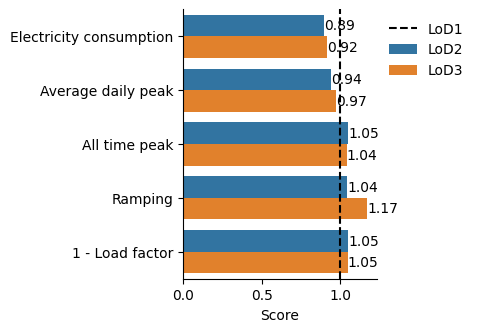

In [25]:
##KPIs: net electricity consumption, average daily peak demand, ramping, load factor, cost; comparing LOD 1, LOD 2, LOD 3
### Note: may not include all KPIs in final paper, for example ramping, 1 - LF may not be relevant/necessary since we didn't
### really do anything to specifically target these KPIs

directory = os.path.join(FileHandler.JOURNAL_PAPER_FIGURES_DIRECTORY, 'kpi')
os.makedirs(directory, exist_ok=True)

def get_kpis(lod: str, electricity_consumption: list, cost: list):
    return {
        'LoD': 'LoD' + (lod.split('_')[-1]),
        # 'Cost': CostFunction.cost(cost)[-1],
        'Electricity consumption': CostFunction.electricity_consumption(electricity_consumption)[-1],
        'Average daily peak': CostFunction.peak(electricity_consumption, window=24)[-1],
        'All time peak': CostFunction.peak(electricity_consumption, window=ldata.shape[0] + 1)[-1],
        'Ramping': CostFunction.ramping(electricity_consumption)[-1],
        '1 - Load factor': CostFunction.one_minus_load_factor(electricity_consumption, window=730)[-1],
    }

records = []
building_kpis = [
    # 'Cost', 
    'Electricity consumption'
]

# building level
for (b, l), ldata in data_reg.groupby(['bldg_name', 'lod']):
    electricity_consumption = ldata['net_electricity_consumption'].tolist()
    cost = ldata['net_electricity_consumption_cost'].tolist()
    record = {
        'environment': b,
        **get_kpis(l, electricity_consumption, cost)
    }
    records.append(record)

# district level
plot_data = data_reg.copy()
plot_data = plot_data.groupby(['lod', 'bldg_name', 'time_step'])[[
    'net_electricity_consumption', 'net_electricity_consumption_cost'
]].sum().reset_index()

for l, ldata in plot_data.groupby('lod'):
    electricity_consumption = ldata['net_electricity_consumption'].tolist()
    cost = ldata['net_electricity_consumption_cost'].tolist()
    _record = get_kpis(l, electricity_consumption, cost)
    record = {
        'environment': 'district',
        **_record,
        **{k: np.mean([r[k] for r in records if r['environment'] != 'district' and r['LoD'] == _record['LoD']]) for k in building_kpis}
    }
    records.append(record)

kpis = pd.DataFrame(records)
kpis = kpis.melt(id_vars=['environment', 'LoD'])
lod1_kpis = kpis[kpis['LoD']=='LoD1'].copy()
lod1_kpis = lod1_kpis.rename(columns={'value': 'lod1_value'}).drop(columns=['LoD'])
kpis = kpis.merge(lod1_kpis, on=['environment', 'variable'])
kpis['norm_value'] = kpis['value']/kpis['lod1_value']
kpis = kpis[kpis['LoD']!='LoD1'].copy()

for e, edata in kpis.groupby('environment'):
    fig, ax = plt.subplots(1, 1, figsize=(2.5, 3.5))
    sns.barplot(data=edata, x='norm_value', y='variable', hue='LoD', order=list(records[0].keys())[2:], ax=ax)
    ax.axvline(1.0, color='black', linestyle='--', label='LoD1')
    ax.set_xlabel('Score')
    ax.set_ylabel(None)

    for s in ['right', 'top']:
        ax.spines[s].set_visible(False)

    for p in ax.patches:
        ax.text(p.get_x() + p.get_width(), p.get_y() + p.get_height()/2.0, f'{p.get_width():0.2f}', ha='left', va='center')

    ax.legend(
        bbox_to_anchor=(1.0, 1.0),
        loc='upper left',
        framealpha=0,
        ncol=1
    )

    plt.savefig(os.path.join(directory, f'{e}.pdf'), bbox_inches='tight', transparent=True)

    if e == 'district':
        plt.show()
    
    else:
        plt.close()

### Plot the number of SP interactions over time (similar to ASHRAE plot maybe?)

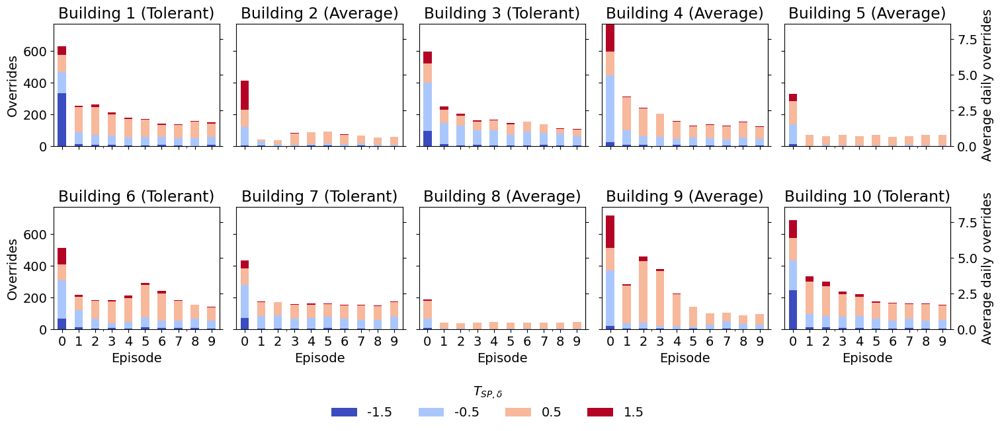

In [70]:
### Similar to ASHRAE plot maybe? SHowing the quantity of the setpoint change as well perhaps
plt.rcParams.update({'font.size': 14}) 
key = 'occupant_interaction_indoor_dry_bulb_temperature_set_point_delta_summary'
simulation_ids = [s for s in SIMULATION_IDS if 'lod_3' in s]
plot_data = {list(s.keys())[0]: list(s.values())[0] for s in [DataHandler.get_evaluation_summary([s]) for s in simulation_ids]}
delta_data_list = []

for k, v in plot_data.items():
    for b, bdata in v[key].items():
        for i, d in enumerate(bdata[2:-1]):
            d = pd.DataFrame(d).T
            d.columns = ['delta', 'count']
            d['bldg_name'] = b
            d['bldg_index'] = int(metadata[metadata['bldg_name']==b].iloc[0]['ID_final'])
            d['setpoint_id'] = metadata[metadata['bldg_name']==b].iloc[0]['setpoint_id']
            d['episode'] = i
            d['random_seed'] = v['random_seed']
            delta_data_list.append(d)

delta_data = pd.concat(delta_data_list, ignore_index=True)
delta_data = delta_data[delta_data['delta']!=0.0].copy()
ymax = delta_data.groupby(['bldg_index', 'episode'])['count'].sum().max()
days = (data_reg['time_step']/24).astype(int).max() + 1
building_count = len(delta_data['bldg_name'].unique())
column_count_limit = 5
row_count = math.ceil(building_count/column_count_limit)
column_count = min(building_count, column_count_limit)
fig, _ = plt.subplots(row_count, column_count, figsize=(3.5*column_count, 3*row_count), sharex=True, sharey=True, gridspec_kw={'hspace': 0.50, 'wspace': 0.1})

for ax in fig.axes[building_count:]:
    fig.delaxes(ax)

for i, (ax, ((b, s), bdata)) in enumerate(zip(fig.axes, delta_data.groupby(['bldg_index', 'setpoint_id', ]))):
    bdata = bdata[bdata['random_seed']==bdata['random_seed'].max()].pivot(index='episode', columns='delta', values='count')
    bdata.plot(kind='bar', stacked=True, ax=ax, colormap='coolwarm')
    ax.set_xlabel('Episode')
    ax.set_ylabel('Overrides')
    ax.margins(0)
    ax.tick_params(axis='x', rotation=0)
    ax.set_title(f'Building {b} ({s})')
    secax_y = ax.secondary_yaxis('right', functions=(lambda x: x/days, lambda x: x*days))

    if i == 0:
        ax.legend(
            #title=r'$T^{SP, \delta}$',
            title=r'$T_{SP, \delta}$',
            bbox_to_anchor=(0.5, 0.0),
            loc='upper center', 
            bbox_transform=fig.transFigure,
            framealpha=0,
            ncol=len(delta_data['delta'].unique())
        )
    
    else:
        ax.legend().remove()

    if i == building_count - 1 or (i + 1) % column_count_limit == 0:
        secax_y.set_ylabel('Average daily overrides')
    
    else:
        secax_y.tick_params(labelright=False)

plt.savefig(os.path.join(FileHandler.JOURNAL_PAPER_FIGURES_DIRECTORY, f'override_per_episode.pdf'), bbox_inches='tight', transparent=False)
plt.show()

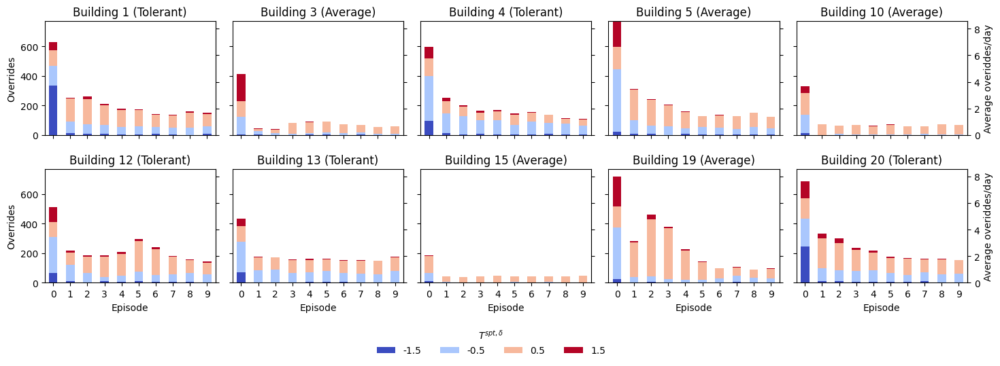

In [32]:
### Similar to ASHRAE plot maybe? SHowing the quantity of the setpoint change as well perhaps
key = 'occupant_interaction_indoor_dry_bulb_temperature_set_point_delta_summary'
simulation_ids = [s for s in SIMULATION_IDS if 'lod_3' in s]
plot_data = {list(s.keys())[0]: list(s.values())[0] for s in [DataHandler.get_evaluation_summary([s]) for s in simulation_ids]}
delta_data_list = []

for k, v in plot_data.items():
    for b, bdata in v[key].items():
        for i, d in enumerate(bdata[2:-1]):
            d = pd.DataFrame(d).T
            d.columns = ['delta', 'count']
            d['bldg_name'] = b
            d['bldg_index'] = metadata[metadata['bldg_name']==b].iloc[0]['bldg_index']
            d['setpoint_id'] = metadata[metadata['bldg_name']==b].iloc[0]['setpoint_id']
            d['episode'] = i
            d['random_seed'] = v['random_seed']
            delta_data_list.append(d)

delta_data = pd.concat(delta_data_list, ignore_index=True)
delta_data = delta_data[delta_data['delta']!=0.0].copy()
ymax = delta_data.groupby(['bldg_index', 'episode'])['count'].sum().max()
days = (data_reg['time_step']/24).astype(int).max() + 1
building_count = len(delta_data['bldg_name'].unique())
column_count_limit = 5
row_count = math.ceil(building_count/column_count_limit)
column_count = min(building_count, column_count_limit)
fig, _ = plt.subplots(row_count, column_count, figsize=(3.5*column_count, 2.5*row_count), sharex=True, sharey=True, gridspec_kw={'hspace': 0.3, 'wspace': 0.1})

for ax in fig.axes[building_count:]:
    fig.delaxes(ax)

for i, (ax, ((b, s), bdata)) in enumerate(zip(fig.axes, delta_data.groupby(['bldg_index', 'setpoint_id', ]))):
    bdata = bdata[bdata['random_seed']==bdata['random_seed'].max()].pivot(index='episode', columns='delta', values='count')
    bdata.plot(kind='bar', stacked=True, ax=ax, colormap='coolwarm')
    ax.set_xlabel('Episode')
    ax.set_ylabel('Overrides')
    ax.margins(0)
    ax.tick_params(axis='x', rotation=0)
    ax.set_title(f'Building {b} ({s})')
    secax_y = ax.secondary_yaxis('right', functions=(lambda x: x/days, lambda x: x*days))

    if i == 0:
        ax.legend(
            title=r'$T^{spt, \delta}$',
            bbox_to_anchor=(0.5, 0.0),
            loc='upper center', 
            bbox_transform=fig.transFigure,
            framealpha=0,
            ncol=len(delta_data['delta'].unique())
        )
    
    else:
        ax.legend().remove()

    if i == building_count - 1 or (i + 1) % column_count_limit == 0:
        secax_y.set_ylabel('Average overiddes/day')
    
    else:
        secax_y.tick_params(labelright=False)

plt.savefig(os.path.join(FileHandler.JOURNAL_PAPER_FIGURES_DIRECTORY, f'override_per_episode.pdf'), bbox_inches='tight', transparent=False)
plt.show()

### Calculate for each building: number of overrides during DR events, total # of overrides

In [50]:
### see this file for details on when the DR events occur:
### file_path = '/root/CityLearn/simulation/data/DR_Setpoints_Electricity_Prices/DR_Events_2022.csv'
### Columns: 'DR_Event_Timestep' == 1 if timestep is a DR_Event, else 0
    ####     'DR_Event_Start' == 1 is first timestep of a DR event, else 0
    ####     'DR_Event' == counting integer for each unique DR event, e.g. event 2 is 2 (25 total), else 0
    ####     'DR_Day' == not zero if that day has a DR_event, else 0

dr_data = pd.read_csv(os.path.join(FileHandler.DATA_DIRECTORY, 'DR_Setpoints_Electricity_Prices', 'DR_Events_2022.csv'))
plot_data = data_reg.merge(dr_data[['time_step', 'DR_Event_Timestep']], on='time_step', how='left')
plot_data['override_during_dr'] = 0 
plot_data.loc[
    (plot_data['DR_Event_Timestep']==1) 
    & (plot_data['occupant_interaction_indoor_dry_bulb_temperature_set_point_delta'].abs()>0), 
    'override_during_dr'
] = 1
plot_data = plot_data.groupby(['lod', 'bldg_index'])[['override_during_dr']].sum().reset_index()
plot_data = plot_data.pivot(index='bldg_index', columns='lod', values='override_during_dr')
display(plot_data)

lod,lod_1,lod_2,lod_3
bldg_index,,,
1,5,5,33
3,0,3,6
4,3,5,7
5,1,5,7
10,0,2,10
12,3,2,19
13,2,8,13
15,9,2,10
19,2,2,18


In [69]:
### see this file for details on when the DR events occur:
### file_path = '/root/CityLearn/simulation/data/DR_Setpoints_Electricity_Prices/DR_Events_2022.csv'
### Columns: 'DR_Event_Timestep' == 1 if timestep is a DR_Event, else 0
    ####     'DR_Event_Start' == 1 is first timestep of a DR event, else 0
    ####     'DR_Event' == counting integer for each unique DR event, e.g. event 2 is 2 (25 total), else 0
    ####     'DR_Day' == not zero if that day has a DR_event, else 0

dr_data = pd.read_csv(os.path.join(FileHandler.DATA_DIRECTORY, 'DR_Setpoints_Electricity_Prices', 'DR_Events_2022.csv'))
plot_data = data_reg.merge(dr_data[['time_step', 'DR_Event_Timestep']], on='time_step', how='left')
plot_data['override_during_dr'] = 0 

filtered_data = plot_data[plot_data['lod'] == 'lod_3']
sum_per_building = filtered_data.groupby('bldg_index')['occupant_interaction_indoor_dry_bulb_temperature_set_point_delta'].apply(lambda x: (x.abs() > 0).sum()).reset_index()
sum_per_building.columns = ['bldg_index', 'num_instances_abs_temperature_delta']

plot_data.loc[
    (plot_data['DR_Event_Timestep']==1) 
    & (plot_data['occupant_interaction_indoor_dry_bulb_temperature_set_point_delta'].abs()>0), 
    'override_during_dr'
] = 1
plot_data_2 = plot_data.groupby(['lod', 'bldg_index'])[['override_during_dr']].sum().reset_index()
plot_data_2 = plot_data_2.pivot(index='bldg_index', columns='lod', values='override_during_dr')
#display(plot_data)
#plot_data

In [77]:
plot_data_2 = plot_data_2.reset_index()

In [78]:
plot_data_2

lod,bldg_index,lod_1,lod_2,lod_3
0,1,5,5,33
1,3,0,3,6
2,4,3,5,7
3,5,1,5,7
4,10,0,2,10
5,12,3,2,19
6,13,2,8,13
7,15,9,2,10
8,19,2,2,18
9,20,4,4,20


In [198]:
# Left merge sum_per_building with df based on bldg_index
merged_df = sum_per_building.merge(plot_data_2, how='left', on='bldg_index')

merged_df
# Print the merged DataFrame
#print(merged_df)

,bldg_index,num_instances_abs_temperature_delta,lod_1,lod_2,lod_3
0,1,106,5,5,33
1,3,35,0,3,6
2,4,65,3,5,7
3,5,29,1,5,7
4,10,47,0,2,10
5,12,105,3,2,19
6,13,79,2,8,13
7,15,36,9,2,10
8,19,101,2,2,18
9,20,89,4,4,20


In [199]:
merged_df['percent'] = (merged_df['lod_3']/merged_df['num_instances_abs_temperature_delta'])*100

In [208]:
merged_df

,bldg_index,num_instances_abs_temperature_delta,lod_1,lod_2,lod_3,percent
0,1,106,5,5,33,31.132075
1,3,35,0,3,6,17.142857
2,4,65,3,5,7,10.769231
3,5,29,1,5,7,24.137931
4,10,47,0,2,10,21.276596
5,12,105,3,2,19,18.095238
6,13,79,2,8,13,16.455696
7,15,36,9,2,10,27.777778
8,19,101,2,2,18,17.821782
9,20,89,4,4,20,22.471910


In [206]:
avg = merged_df['percent'].mean()

In [209]:
avg_2 = merged_df['num_instances_abs_temperature_delta'].mean()/13

In [210]:
avg_2

5.323076923076924

### Calculate for each building: number of discomfort hours (>2C between T_in and T_SP) 

In [185]:
### (perhaps compare to lOD 2?)
band = 2
plot_data = data_reg[data_reg['lod'] != 'lod_1'].copy()
plot_data['delta'] = plot_data['indoor_dry_bulb_temperature'] - plot_data['indoor_dry_bulb_temperature_set_point']
plot_data['discomfort'] = 0
plot_data.loc[plot_data['delta'].abs() > band, 'discomfort'] = 1
plot_data = plot_data.groupby(['lod', 'bldg_index'])[['discomfort']].sum()
plot_data['discomfort_percentage'] = plot_data['discomfort']*100.0/(data_reg['time_step'].max() + 1)
plot_data = plot_data.reset_index().pivot(index='bldg_index', columns='lod', values='discomfort')

##total hours: 2159
plot_data['Percent_Discomfort_LOD2'] = round((plot_data['lod_2']/2160)*100, 1)
plot_data['Percent_Discomfort_LOD3'] = round((plot_data['lod_3']/2160)*100, 1)

display(plot_data)

lod,lod_2,lod_3,Percent_Discomfort_LOD2,Percent_Discomfort_LOD3
bldg_index,,,,
1,22,122,1.0,5.6
3,21,99,1.0,4.6
4,18,61,0.8,2.8
5,25,42,1.2,1.9
10,15,25,0.7,1.2
12,17,168,0.8,7.8
13,55,83,2.5,3.8
15,26,37,1.2,1.7
19,36,207,1.7,9.6


In [138]:
band = 2
plot_data_lod_2 = data_reg[data_reg['lod'] == 'lod_2'].copy()
plot_data_lod_2['delta'] = plot_data_lod_2['indoor_dry_bulb_temperature'] - plot_data_lod_2['indoor_dry_bulb_temperature_set_point']

In [141]:
import seaborn as sns
import matplotlib.colors as mcolors

In [190]:
band = 2
plot_data_lod_2 = data_reg[data_reg['lod'] == 'lod_2'].copy()
plot_data_lod_2['delta'] = plot_data_lod_2['indoor_dry_bulb_temperature'] - plot_data_lod_2['indoor_dry_bulb_temperature_set_point']

# Generate a pivot table to count occurrences of delta values for each building
pivot_table = plot_data_lod_2.pivot_table(index='delta', columns='building_id', aggfunc='size', fill_value=0)

filtered_data = plot_data_lod_2[(plot_data_lod_2['delta'] >= -3) & (plot_data_lod_2['delta'] <= 3)]

# Round delta values to the nearest 0.25
filtered_data['delta_rounded'] = np.round(filtered_data['delta'] * 4) / 4

# Generate a pivot table to count occurrences of rounded delta values for each building
pivot_table_rounded_filtered = filtered_data.pivot_table(index='delta_rounded', columns='building_id', aggfunc='size', fill_value=0)

pivot_table_rounded_filtered = pivot_table_rounded_filtered.reindex(columns=[col for col in pivot_table_rounded_filtered.columns if col != 'Building 10'] + ['Building 10'])

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


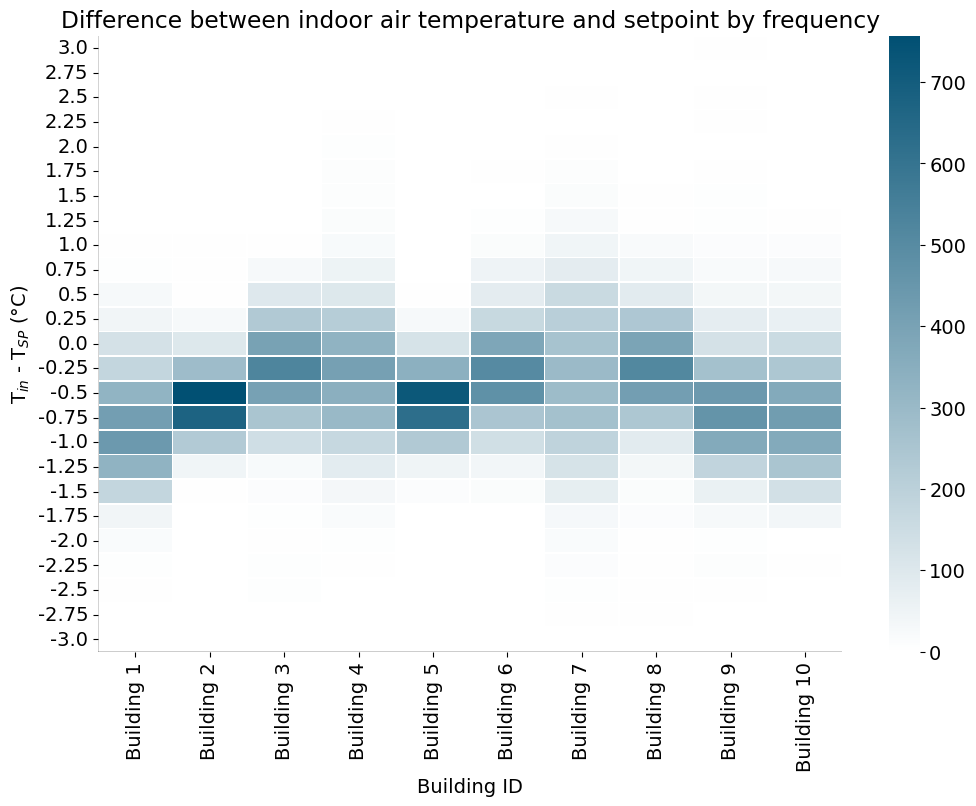

In [191]:
plot_data_lod_2 = data_reg[data_reg['lod'] == 'lod_2'].copy()
plot_data_lod_2['delta'] = plot_data_lod_2['indoor_dry_bulb_temperature'] - plot_data_lod_2['indoor_dry_bulb_temperature_set_point']

# Generate a pivot table to count occurrences of delta values for each building
pivot_table = plot_data_lod_2.pivot_table(index='delta', columns='building_id', aggfunc='size', fill_value=0)

filtered_data = plot_data_lod_2[(plot_data_lod_2['delta'] >= -3) & (plot_data_lod_2['delta'] <= 3)]

# Round delta values to the nearest 0.25
filtered_data['delta_rounded'] = np.round(filtered_data['delta'] * 4) / 4

# Generate a pivot table to count occurrences of rounded delta values for each building
pivot_table_rounded_filtered = filtered_data.pivot_table(index='delta_rounded', columns='building_id', aggfunc='size', fill_value=0)

pivot_table_rounded_filtered = pivot_table_rounded_filtered.reindex(columns=[col for col in pivot_table_rounded_filtered.columns if col != 'Building 10'] + ['Building 10'])

# Define the custom color
blue_color = '#015073'

matplotlib.rcParams.update({'font.size': 14})

# Create custom colormap with specified blue color
colors = [(1, 1, 1), mcolors.hex2color(blue_color)]  # Start with white and end with blue
custom_cmap = mcolors.LinearSegmentedColormap.from_list('custom_Blue', colors)

# Plot heatmap with custom colormap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_rounded_filtered, cmap=custom_cmap, linewidths=0.5, linecolor='white')
plt.title('Difference between indoor air temperature and setpoint by frequency')
plt.xlabel('Building ID')
plt.ylabel('T$_{in}$ - T$_{SP}$ (\u00b0C)')
plt.yticks(rotation=0)  # Rotate y-axis labels for better readability

plt.axhline(0, color='black', linewidth=1)
#plt.axvline(len(pivot_table_rounded_filtered.columns), color='black', linewidth=1)
plt.axvline(0, color='black', linewidth=0.25)

# Flip the y-axis
plt.gca().invert_yaxis()

plt.show()

In [192]:
# LoD 2
plot_data_lod_2 = data_reg[data_reg['lod'] == 'lod_2'].copy()
plot_data_lod_2['delta'] = plot_data_lod_2['indoor_dry_bulb_temperature'] - plot_data_lod_2['indoor_dry_bulb_temperature_set_point']

# LoD 3
plot_data_lod_3 = data_reg[data_reg['lod'] == 'lod_3'].copy()
plot_data_lod_3['delta'] = plot_data_lod_3['indoor_dry_bulb_temperature'] - plot_data_lod_3['indoor_dry_bulb_temperature_set_point']

# Pre-processing for LoD 2
pivot_table_2 = plot_data_lod_2.pivot_table(index='delta', columns='building_id', aggfunc='size', fill_value=0)
filtered_data_2 = plot_data_lod_2[(plot_data_lod_2['delta'] >= -3) & (plot_data_lod_2['delta'] <= 3)]
filtered_data_2['delta_rounded'] = np.round(filtered_data_2['delta'] * 4) / 4
pivot_table_rounded_filtered_2 = filtered_data_2.pivot_table(index='delta_rounded', columns='building_id', aggfunc='size', fill_value=0)
pivot_table_rounded_filtered_2 = pivot_table_rounded_filtered_2.reindex(columns=[col for col in pivot_table_rounded_filtered_2.columns if col != 'Building 10'] + ['Building 10'])

# Pre-processing for LoD 3
pivot_table_3 = plot_data_lod_3.pivot_table(index='delta', columns='building_id', aggfunc='size', fill_value=0)
filtered_data_3 = plot_data_lod_3[(plot_data_lod_3['delta'] >= -3) & (plot_data_lod_3['delta'] <= 3)]
filtered_data_3['delta_rounded'] = np.round(filtered_data_3['delta'] * 4) / 4
pivot_table_rounded_filtered_3 = filtered_data_3.pivot_table(index='delta_rounded', columns='building_id', aggfunc='size', fill_value=0)
pivot_table_rounded_filtered_3 = pivot_table_rounded_filtered_3.reindex(columns=[col for col in pivot_table_rounded_filtered_3.columns if col != 'Building 10'] + ['Building 10'])

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


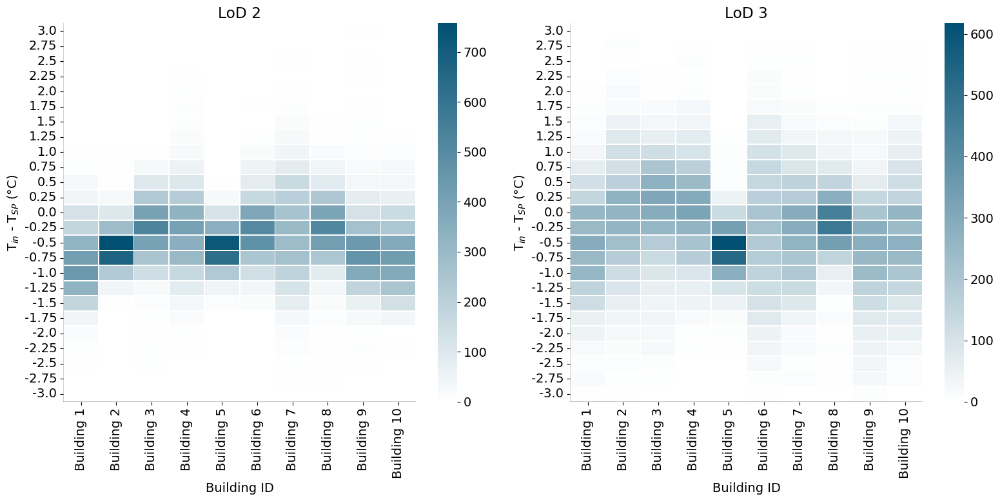

In [195]:
# Define the custom color
blue_color = '#015073'

matplotlib.rcParams.update({'font.size': 14})

# Create custom colormap with specified blue color
colors = [(1, 1, 1), mcolors.hex2color(blue_color)]  # Start with white and end with blue
custom_cmap = mcolors.LinearSegmentedColormap.from_list('custom_Blue', colors)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot for LoD 2
sns.heatmap(pivot_table_rounded_filtered_2, cmap=custom_cmap, linewidths=0.5, linecolor='white', ax=axes[0])
axes[0].set_title('LoD 2')
axes[0].set_xlabel('Building ID')
axes[0].set_ylabel('T$_{in}$ - T$_{SP}$ (\u00b0C)')
#axes[0].set_yticks(rotation=0)
axes[0].axhline(0, color='black', linewidth=1)
axes[0].axvline(0, color='black', linewidth=0.25)
axes[0].invert_yaxis()

# Plot for LoD 3
sns.heatmap(pivot_table_rounded_filtered_3, cmap=custom_cmap, linewidths=0.5, linecolor='white', ax=axes[1])
axes[1].set_title('LoD 3')
axes[1].set_xlabel('Building ID')
axes[1].set_ylabel('T$_{in}$ - T$_{SP}$ (\u00b0C)')
#axes[1].set_yticks(rotation=0)
axes[1].axhline(0, color='black', linewidth=1)
axes[1].axvline(0, color='black', linewidth=0.25)
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()

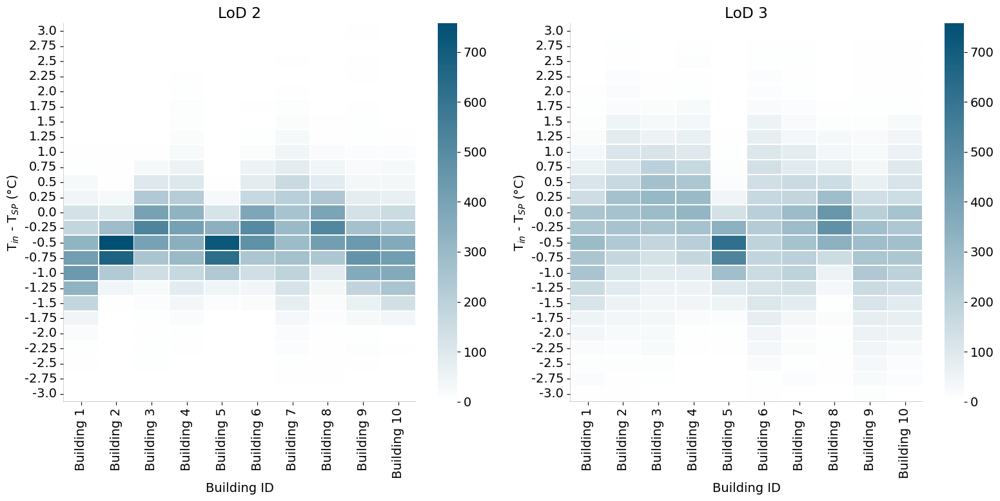

In [196]:
# Define the custom color
blue_color = '#015073'

matplotlib.rcParams.update({'font.size': 14})

# Create custom colormap with specified blue color
colors = [(1, 1, 1), mcolors.hex2color(blue_color)]  # Start with white and end with blue
custom_cmap = mcolors.LinearSegmentedColormap.from_list('custom_Blue', colors)

# Calculate max value for colormap
max_value = max(pivot_table_rounded_filtered_2.values.max(), pivot_table_rounded_filtered_3.values.max())

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot for LoD 2
sns.heatmap(pivot_table_rounded_filtered_2, cmap=custom_cmap, linewidths=0.5, linecolor='white', ax=axes[0], vmin=0, vmax=max_value)
axes[0].set_title('LoD 2')
axes[0].set_xlabel('Building ID')
axes[0].set_ylabel('T$_{in}$ - T$_{SP}$ (\u00b0C)')
axes[0].axhline(0, color='black', linewidth=1)
axes[0].axvline(0, color='black', linewidth=0.25)
axes[0].invert_yaxis()

# Plot for LoD 3
sns.heatmap(pivot_table_rounded_filtered_3, cmap=custom_cmap, linewidths=0.5, linecolor='white', ax=axes[1], vmin=0, vmax=max_value)
axes[1].set_title('LoD 3')
axes[1].set_xlabel('Building ID')
axes[1].set_ylabel('T$_{in}$ - T$_{SP}$ (\u00b0C)')
axes[1].axhline(0, color='black', linewidth=1)
axes[1].axvline(0, color='black', linewidth=0.25)
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()